In [1]:
import pandas as pd
import os
import glob
import matplotlib.pyplot as plt
from tqdm import tqdm
%run ..\Functions.ipynb

C:\Users\ntr002\.conda\envs\phd\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
<>:31: SyntaxWarning: invalid escape sequence '\c'
C:\Users\ntr002\AppData\Local\Temp\ipykernel_19536\2858539060.py:31: SyntaxWarning: invalid escape sequence '\c'
  text = f'$y = {m:.2f} \cdot x + {b:.2f}$'


In [2]:
obs_folder=r".\data\insitu"
stations_csv = r".\data\Stations.csv"
df_stations = pd.read_csv(stations_csv, sep=';')
df_stations

,Station,latitude,longitude,Network,elevation,10km_to_coast
0,TA00001,-1.1233,34.3980,TAHMO,1393.0,NaN
1,TA00003,5.4469,-2.1339,TAHMO,63.0,NaN
2,TA00005,5.8077,-2.4264,TAHMO,125.0,NaN
3,TA00007,7.1883,-2.0975,TAHMO,341.0,NaN
4,TA00010,7.3896,-2.1860,TAHMO,337.0,NaN
...,...,...,...,...,...,...
169,TA00762,-3.1987,37.2344,TAHMO,1530.0,NaN
170,TA00763,-6.9655,39.0017,TAHMO,250.0,NaN
171,TA00767,-2.6720,38.3697,TAHMO,544.0,NaN
172,TA00777,-6.7843,39.1471,TAHMO,85.0,NaN


In [5]:
# products=['AgERA5','GEOS5','ERA5','MSG']
products=['AgERA5','GEOS5','ERA5']
#variable column names in df
var_name = 'ra'
col_name = 'radiation AVG (W/m2)' #name of column in insitu csv

# Loop calculating metrics

In [6]:
separator_pattern = r'[,;]'
for product_name in products:
    product_folder = r"../2_extract/data/{0}/daily".format(product_name)
    for i,row in tqdm(df_stations.iterrows(),total = df_stations.shape[0]):
        station=row["Station"]
        network=row['Network']
        # read data from product
        product_fh = os.path.join(product_folder,network+"_"+station+".csv")
        product_df = pd.read_csv(product_fh, parse_dates=True,sep=separator_pattern,engine='python')
        # read data from observation
        obs_fh = os.path.join(obs_folder,network,station+".csv")
        try:        
            obs_df=pd.read_csv(obs_fh, parse_dates=True,sep=separator_pattern,engine='python')      
            #print(obs_fh) ## check loop
            # formating data
            obs_df=obs_df.rename(columns={"timestamp":"time"}) #rename column "time" 
            merge_df = pd.merge(product_df, obs_df, #merge product based on column "time"
                                on = "time",                     
                        how="inner") 
            merge_df.index=pd.to_datetime(merge_df['time']) #convert to datetimeindex
            var_cols = {
                    var_name: product_name,
                    col_name: "Observation"}
            merge_df = merge_df.rename(columns=var_cols)
            df_var = merge_df[[product_name,'Observation']]
            #validataion: calculating metrics
            df_val = df_var.dropna()
            df_stations.loc[i,var_name+'_'+product_name+'_'+'N']=len(df_val)
            metrics=calc_metrics(df_val[product_name], df_val['Observation'])
            #save values to df_stations
            for key in metrics:            
                df_stations.loc[i,var_name+'_'+product_name+'_'+key]=metrics[key]
        except:
            #print('skip {i}'.fornat(i)) ## check loop
            continue #skip if observation csv is not available in folder

100%|████████████████████████████████████████████████████████████████████████████████| 174/174 [00:04<00:00, 40.95it/s]


In [7]:
save_csv=r".\data\validation_{0}2.csv".format(var_name)
df_stations.to_csv(save_csv, sep=';', index=False)

In [9]:
df_stations

,Station,latitude,longitude,Network,ra_AgERA5_N,ra_AgERA5_r2,ra_AgERA5_nse,ra_AgERA5_bias,ra_AgERA5_rmse,ra_GEOS5_N,...,ra_ERA5_N,ra_ERA5_r2,ra_ERA5_nse,ra_ERA5_bias,ra_ERA5_rmse,ra_MSG_N,ra_MSG_r2,ra_MSG_nse,ra_MSG_bias,ra_MSG_rmse
0,Kafr Et-Shaikh,31.096580,30.922310,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Jordan,32.190520,35.617580,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Tal Amara,33.856870,35.986710,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Sakha,31.264440,30.768330,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Dyar Ala,32.316670,35.578610,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,Aniabisi Middleslope,-0.912185,10.845716,WASCAL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
207,Aniabisi Upslope,-0.910629,10.847251,WASCAL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
208,Bongo Atampisi,-0.826477,10.915014,WASCAL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
209,Bongo Soe,-0.782754,10.972921,WASCAL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


# Loop calculating metrics before and after 2020

In [12]:
datestr='2020-02-01'
for product_name in products:
    product_folder = r"../2_extract/data/{0}/daily".format(product_name)
    for i,row in tqdm(df_stations.iterrows(),total = df_stations.shape[0]):
        station=row["Station"]
        network=row['Network']
        # read data from product
        product_fh = os.path.join(product_folder,network+"_"+station+".csv")
        product_df = pd.read_csv(product_fh, parse_dates=True)
        # read data from observation
        obs_fh = os.path.join(obs_folder,network,station+".csv")
        try:        
            obs_df=pd.read_csv(obs_fh, parse_dates=True,sep=';')      
            #print(obs_fh) ## check loop
            # formating data
            obs_df=obs_df.rename(columns={"timestamp":"time"}) #rename column "time" 
            merge_df = pd.merge(product_df, obs_df, #merge product based on column "time"
                                on = "time",                     
                        how="inner") 
            merge_df.index=pd.to_datetime(merge_df['time']) #convert to datetimeindex
            var_cols = {
                    var_name: product_name,
                    col_name: "Observation"}
            merge_df = merge_df.rename(columns=var_cols)
            df_var = merge_df[[product_name,'Observation']]
            #validataion: calculating metrics
            df_val = df_var.dropna()
            
            ## SPLIT BEFORE and AFTER a date
            split_date = pd.to_datetime(datestr)

            # Split DataFrame based on the date
            df_before = df_val[df_val.index < split_date]
            df_after = df_val[df_val.index >= split_date]   
            
            df_stations.loc[i,var_name+'_'+product_name+'_'+'N_before']=len(df_before)
            df_stations.loc[i,var_name+'_'+product_name+'_'+'N_after']=len(df_after)
            df_stations.loc[i,f'{product_name}_mean']=df_val[product_name].mean()
            df_stations.loc[i,f'{product_name}_mean_before']=df_before[product_name].mean()
            df_stations.loc[i,f'{product_name}_mean_after']=df_after[product_name].mean()
            
            # calc metrics            
            metrics_before=calc_metrics(df_before[product_name], df_before['Observation'])
            metrics_after=calc_metrics(df_after[product_name], df_after['Observation'])
           
            
            #save values to df_stations
            for key in metrics_before:            
                df_stations.loc[i,var_name+'_'+product_name+'_'+key+'_before']=metrics_before[key]  
                df_stations.loc[i,var_name+'_'+product_name+'_'+key+'_after']=metrics_after[key]            
        except:
            #print('skip {i}'.fornat(i)) ## check loop
            continue #skip if observation csv is not available in folder            

100%|████████████████████████████████████████████████████████████████████████████████| 211/211 [00:05<00:00, 41.43it/s]


In [13]:
save_csv=r".\data\validation_{0}_split.csv".format(var_name)
df_stations.to_csv(save_csv, sep=';', index=False)

# Plot station scatter and time series

In [7]:
obs_folder=r".\data\insitu"
stations_csv = r".\data\validation_ra.csv"
df_stations = pd.read_csv(stations_csv, sep=';')
df_stations

,Station,latitude,longitude,Network,ra_AgERA5_N,ra_AgERA5_r2,ra_AgERA5_nse,ra_AgERA5_bias,ra_AgERA5_rmse,ra_GEOS5_N,...,ra_ERA5_N,ra_ERA5_r2,ra_ERA5_nse,ra_ERA5_bias,ra_ERA5_rmse,ra_MSG_N,ra_MSG_r2,ra_MSG_nse,ra_MSG_bias,ra_MSG_rmse
0,Kafr Et-Shaikh,31.096580,30.922310,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Jordan,32.190520,35.617580,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Tal Amara,33.856870,35.986710,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Sakha,31.264440,30.768330,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Dyar Ala,32.316670,35.578610,NENAETnet,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,Aniabisi Middleslope,-0.912185,10.845716,WASCAL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
207,Aniabisi Upslope,-0.910629,10.847251,WASCAL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
208,Bongo Atampisi,-0.826477,10.915014,WASCAL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
209,Bongo Soe,-0.782754,10.972921,WASCAL,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
df_stations_metrics = df_stations[pd.notnull(df_stations['ra_AgERA5_N'])]
# products=['AgERA5','GEOS5','ERA5','MSG']
products=['MSG','GEOS5']

TA00001


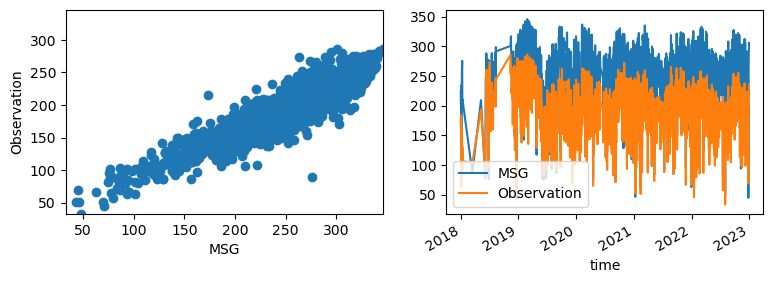

TA00003


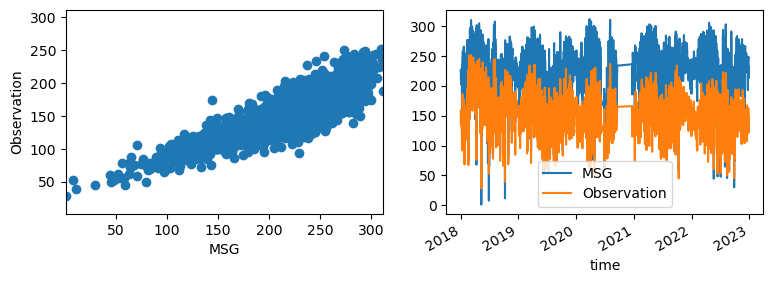

TA00005


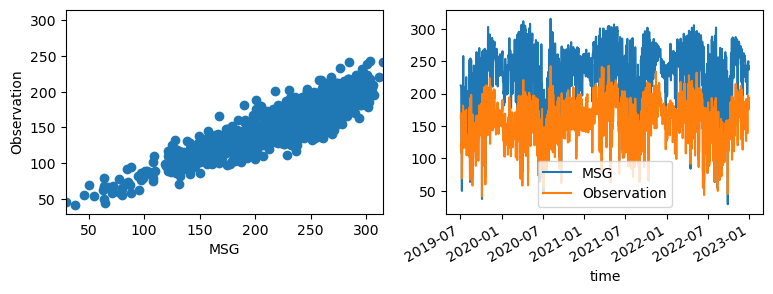

TA00007


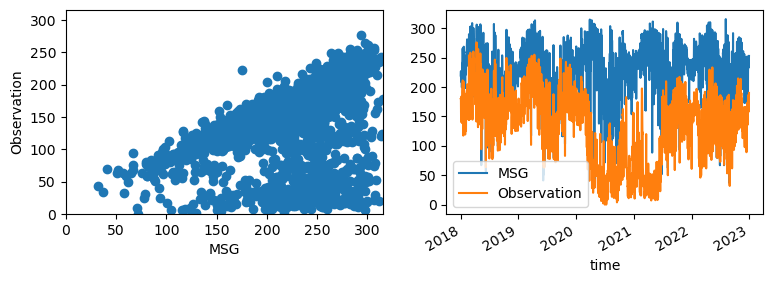

TA00010


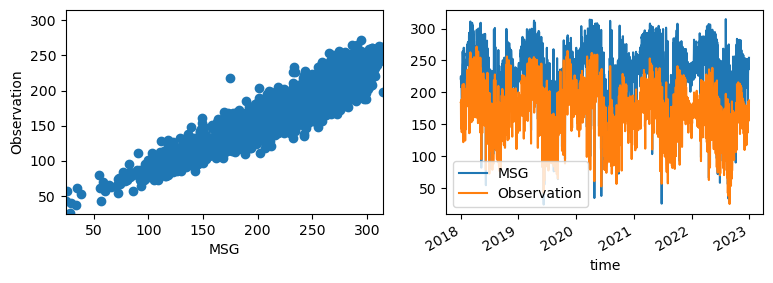

TA00011


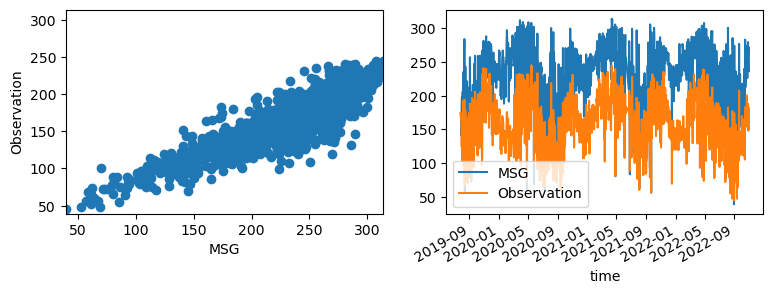

TA00013


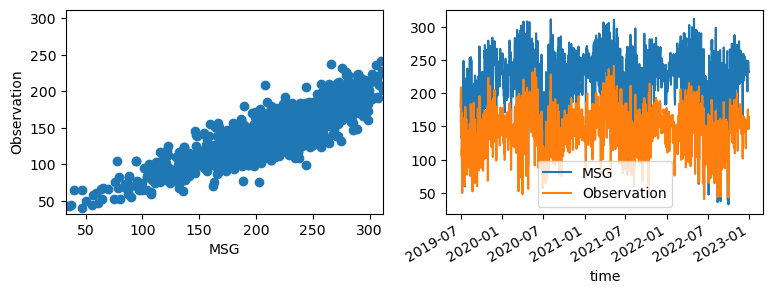

TA00014


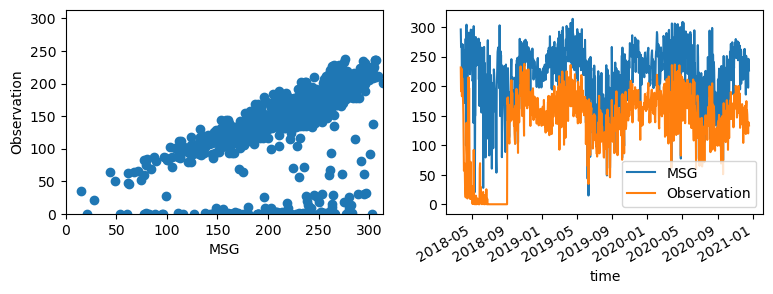

TA00015


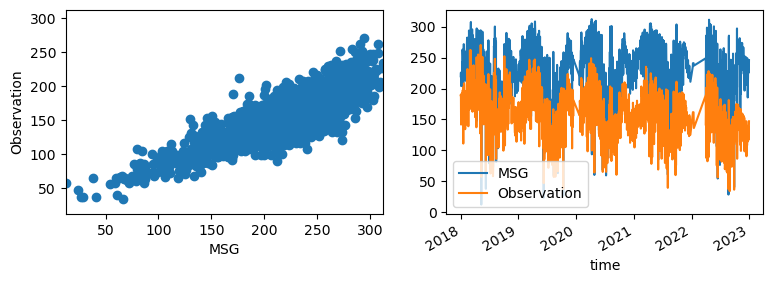

TA00016


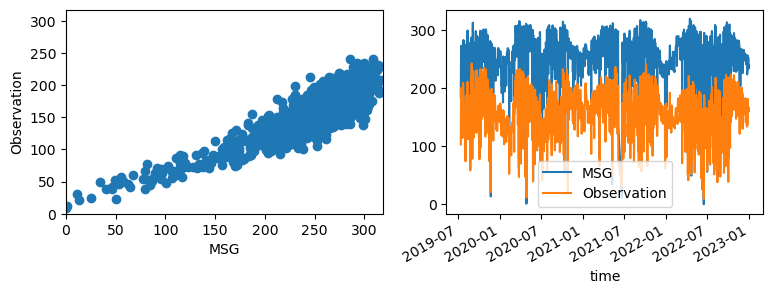

TA00018


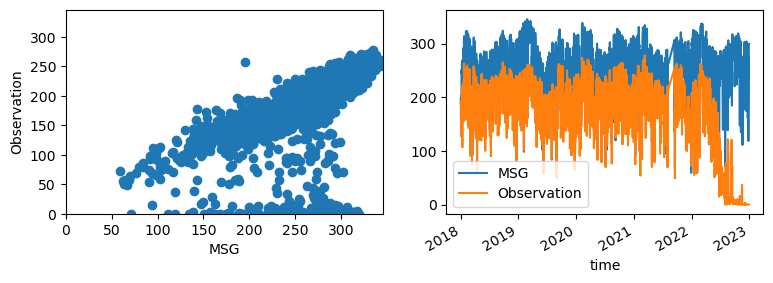

TA00019


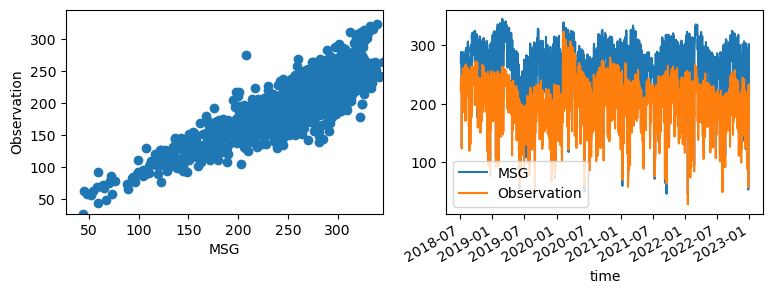

TA00020


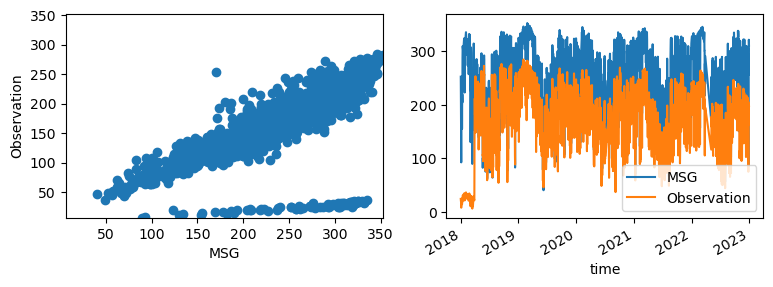

TA00023


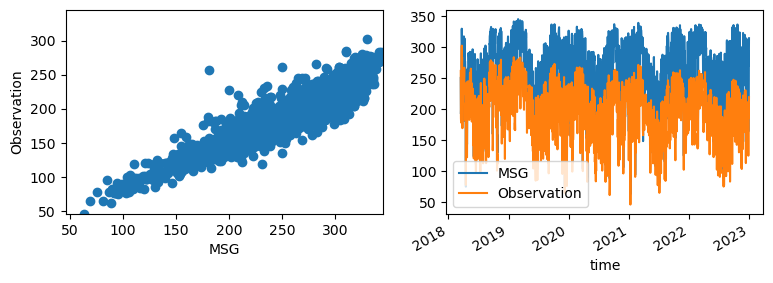

TA00025


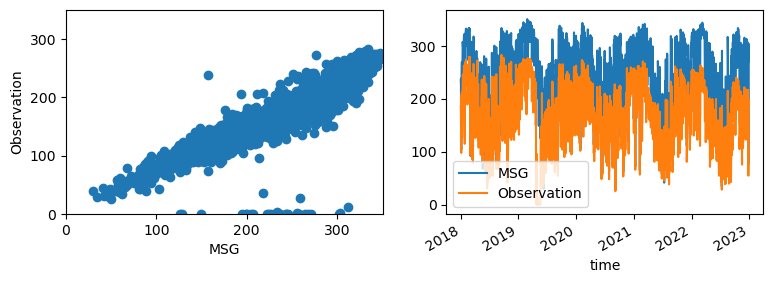

TA00026


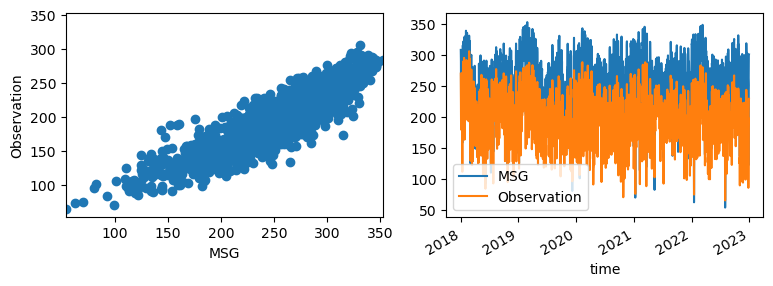

TA00029


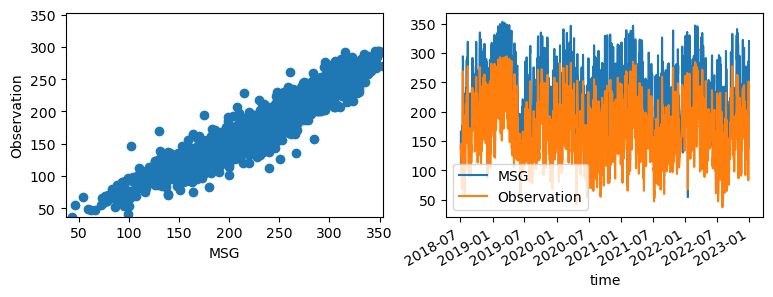

TA00030


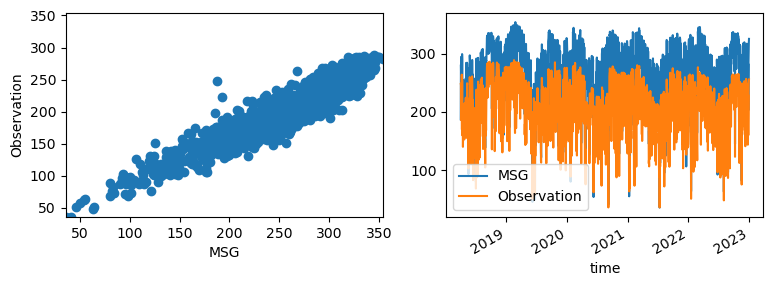

TA00041


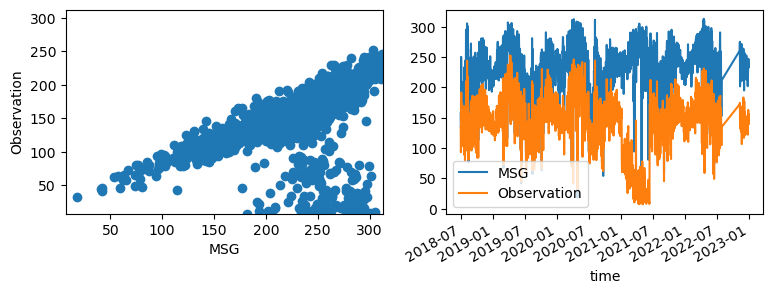

TA00043


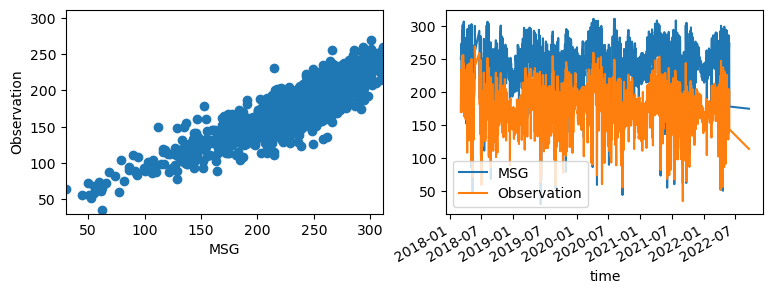

TA00045


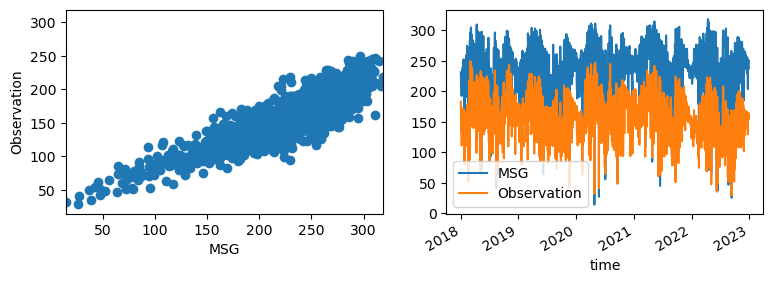

TA00046


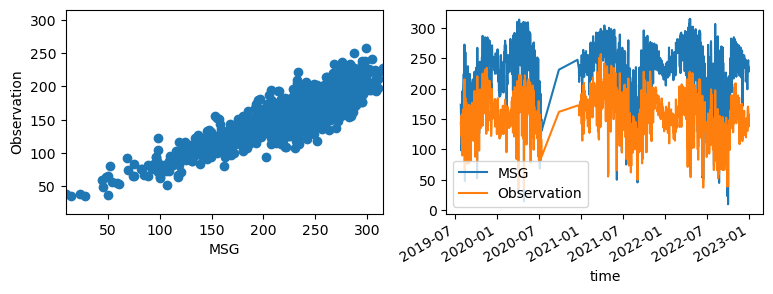

TA00049


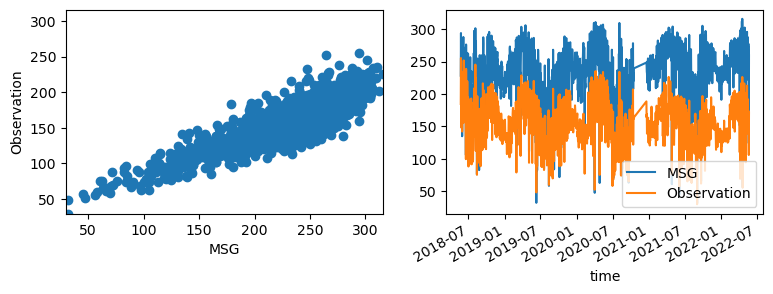

TA00050


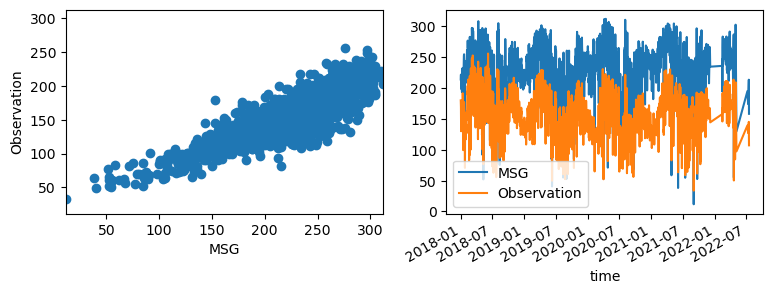

TA00054


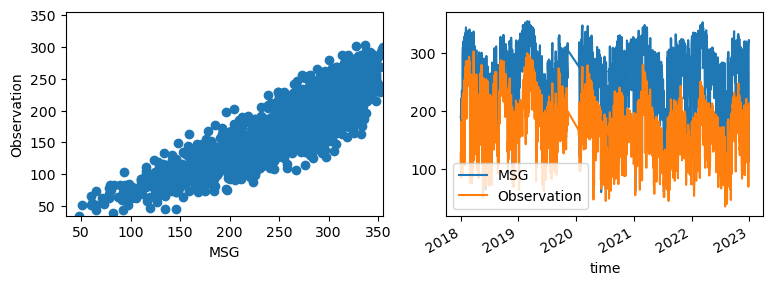

TA00061


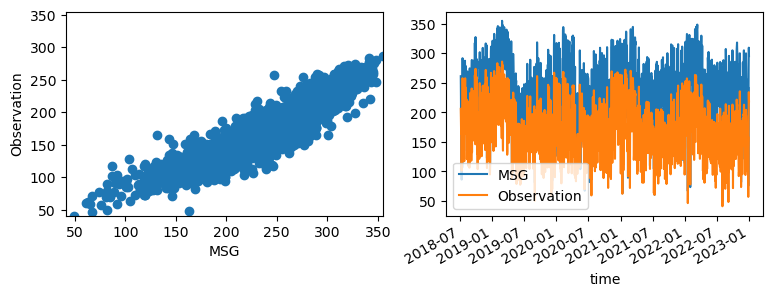

TA00063


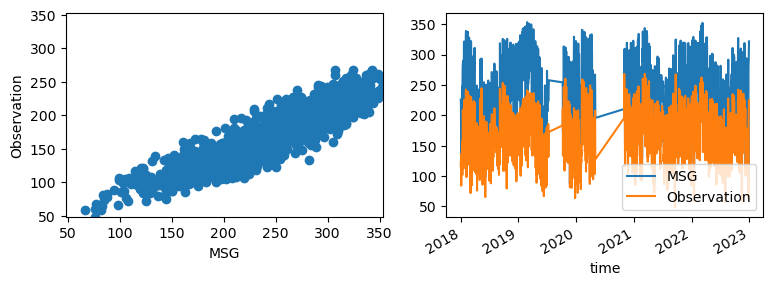

TA00067


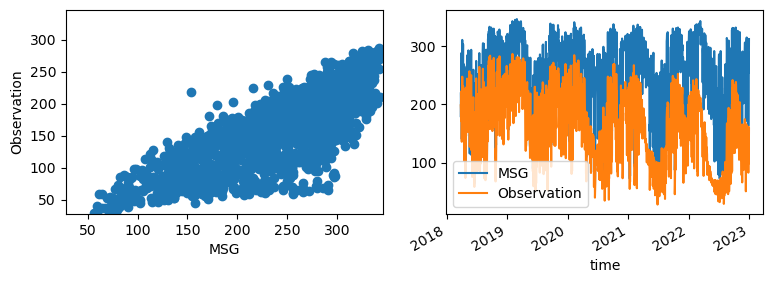

TA00070


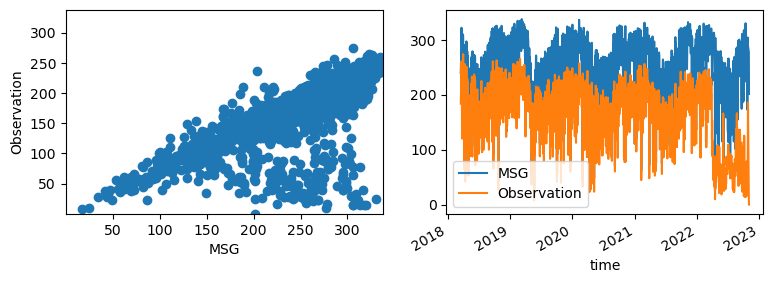

TA00071
TA00072


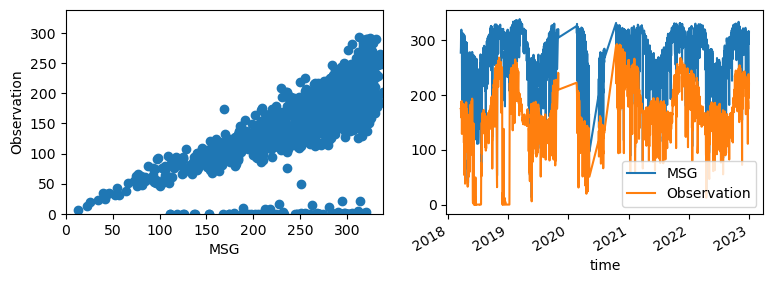

TA00074


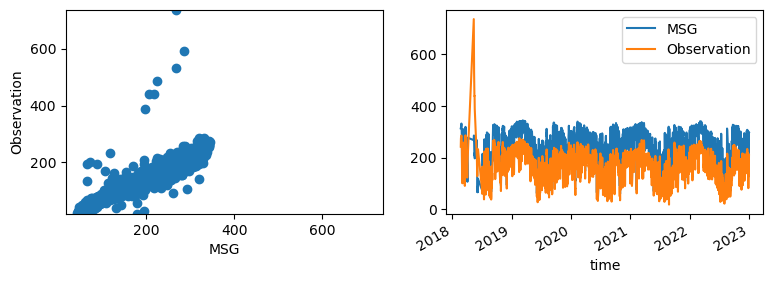

TA00077


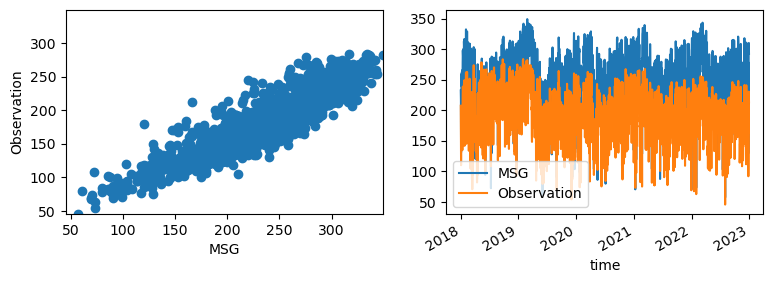

TA00080


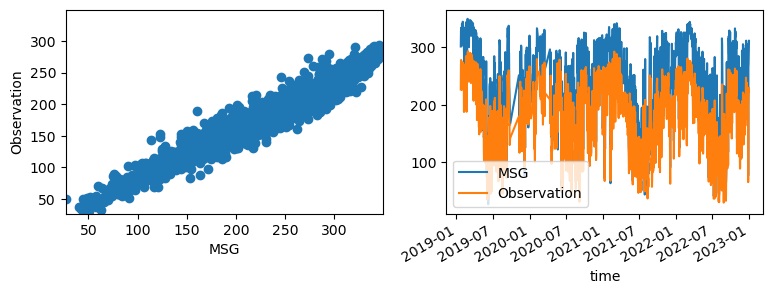

TA00098


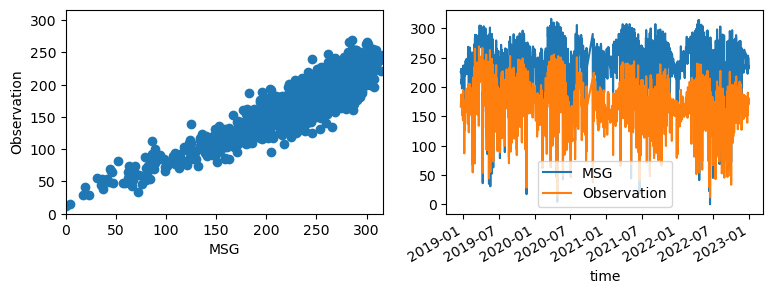

TA00103


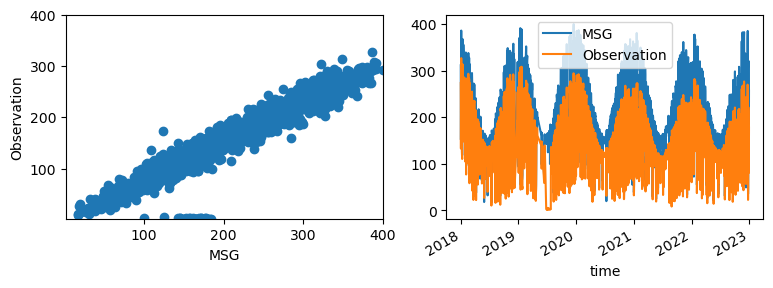

TA00108


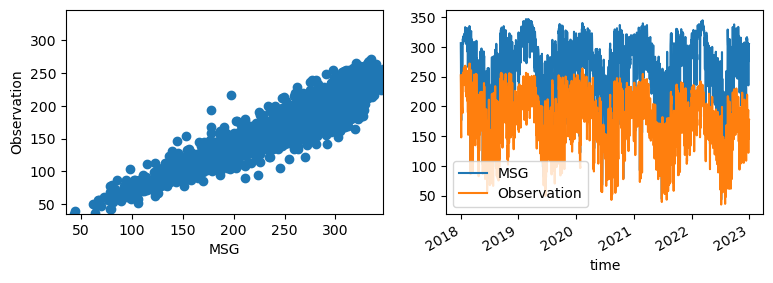

TA00112


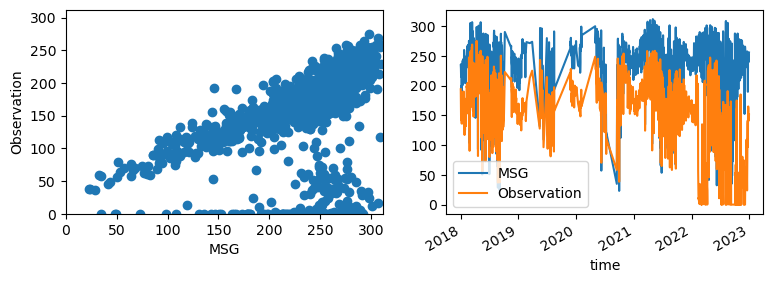

TA00113


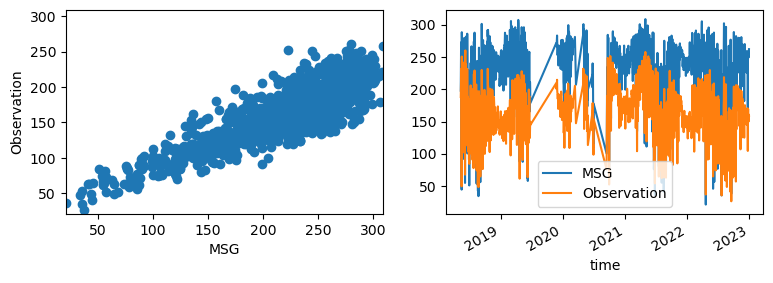

TA00116


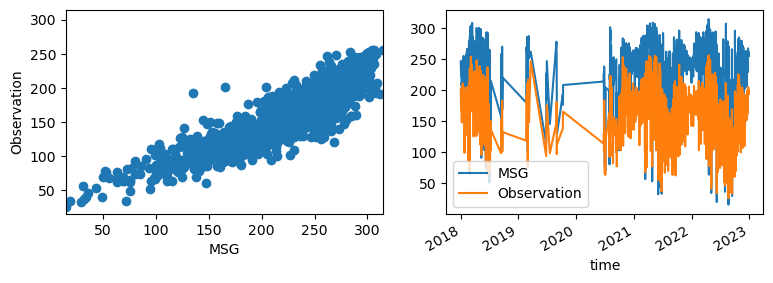

TA00117
TA00118


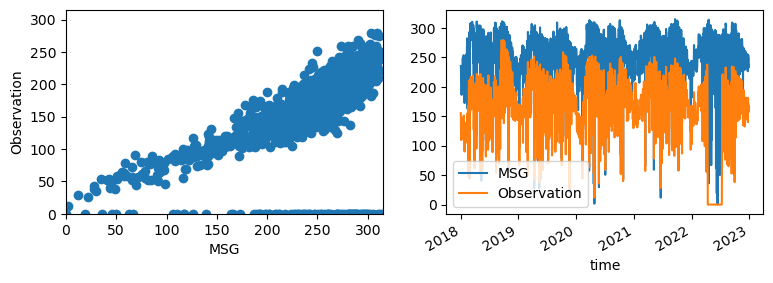

TA00120


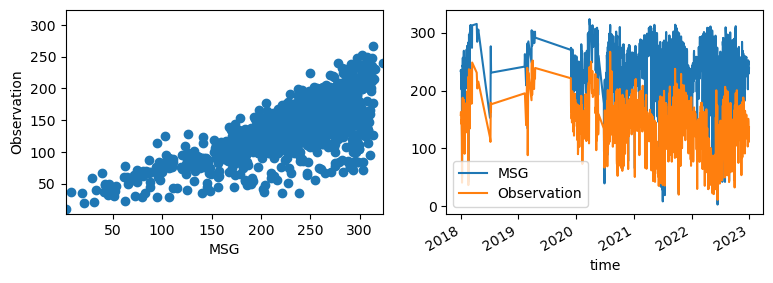

TA00122


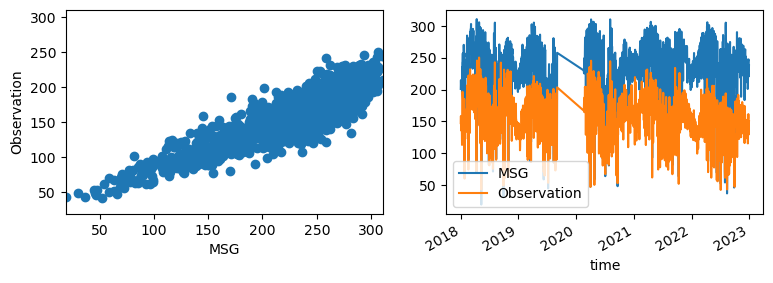

TA00124


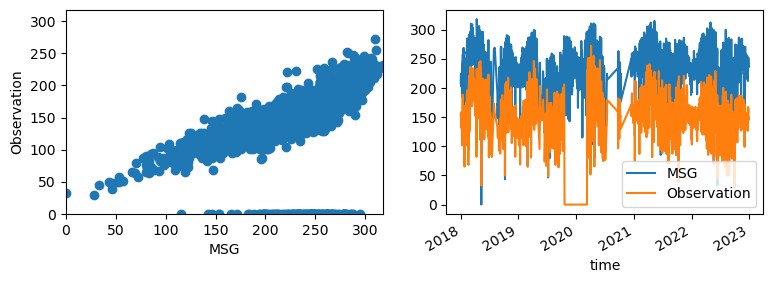

TA00126


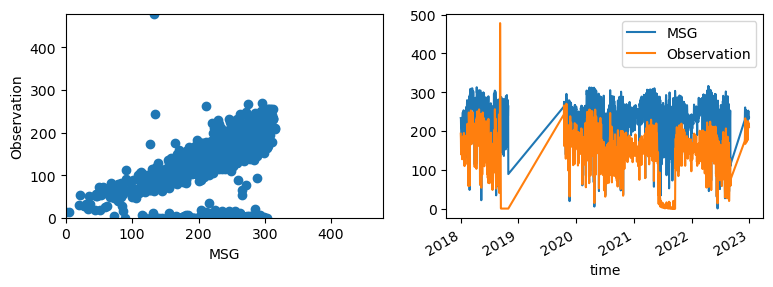

TA00127


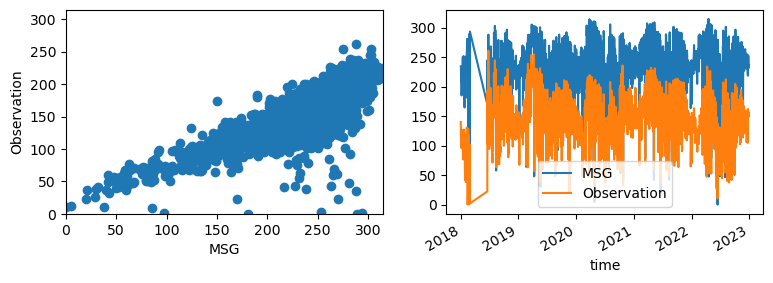

TA00129


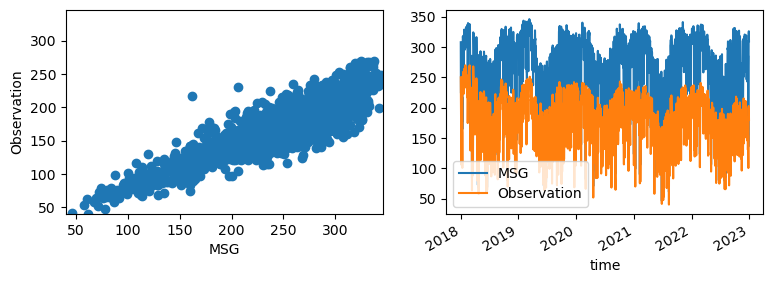

TA00130


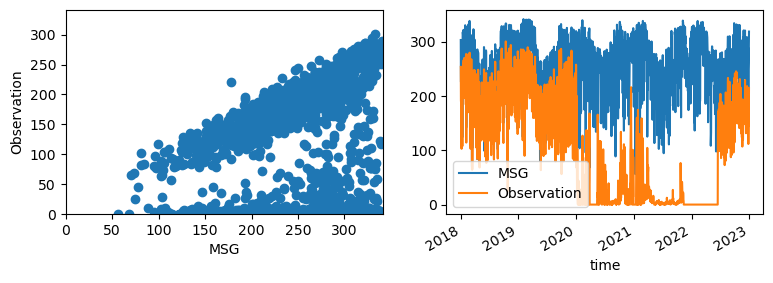

TA00131


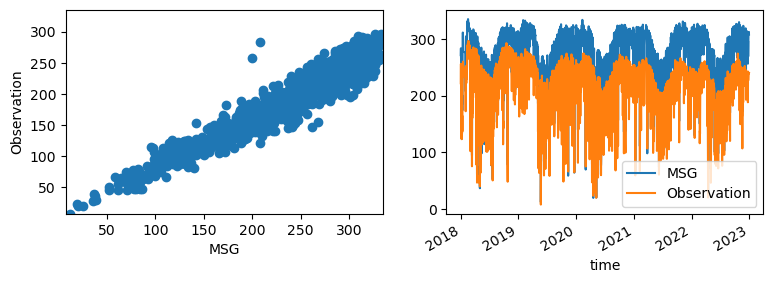

TA00133


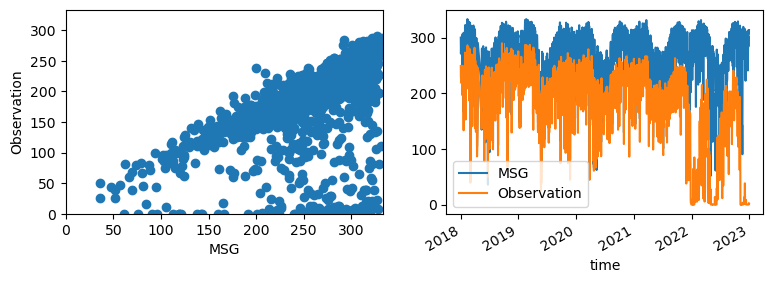

TA00136


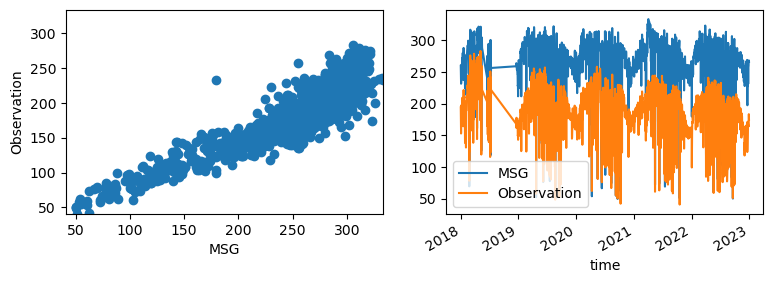

TA00141


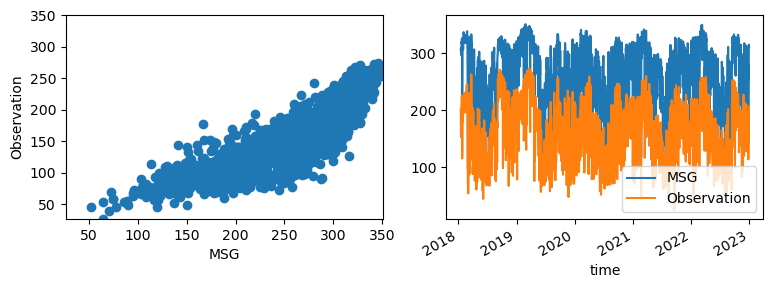

TA00155


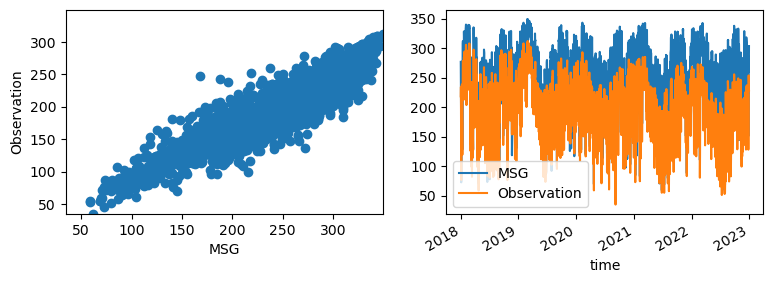

TA00156


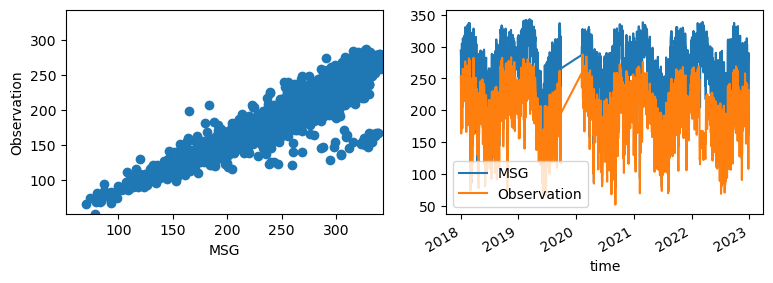

TA00157


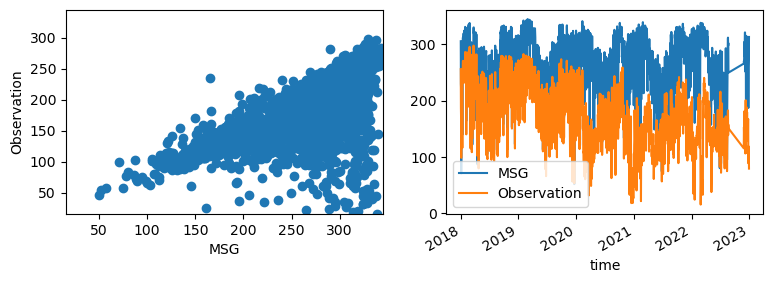

TA00166


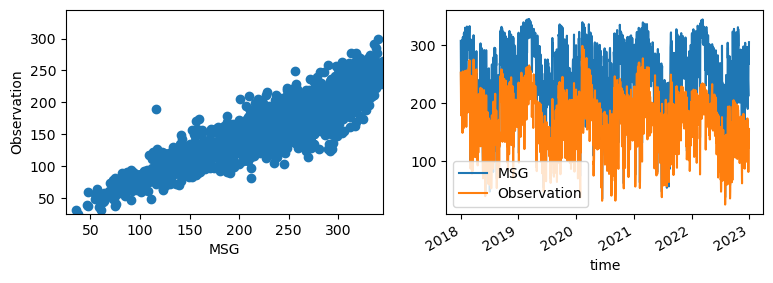

TA00171


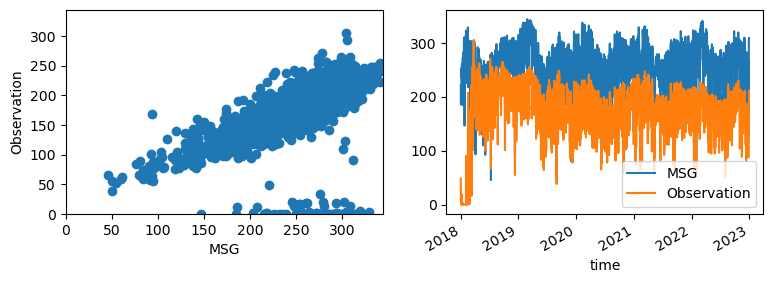

TA00172


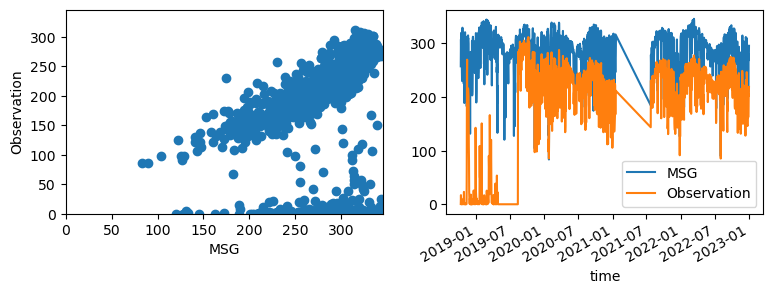

TA00174


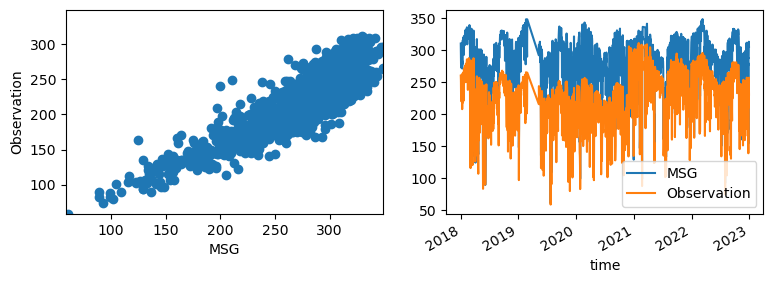

TA00179


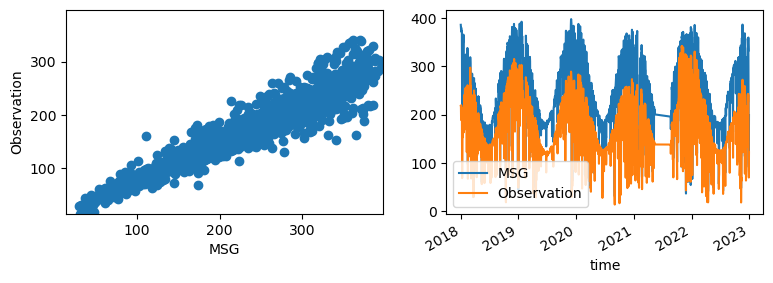

TA00182


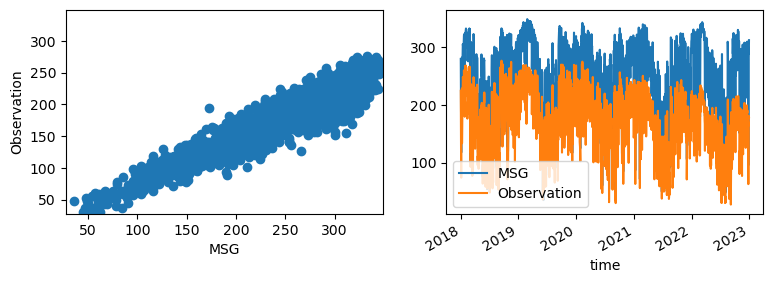

TA00183


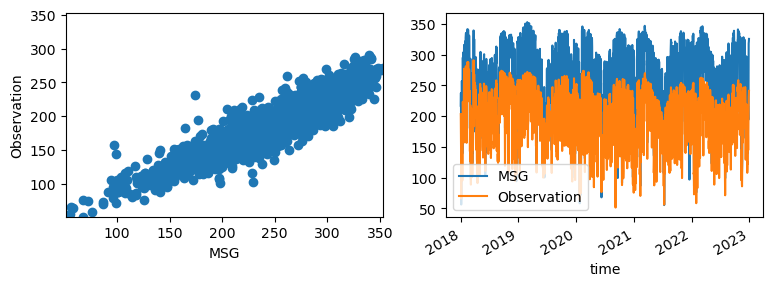

TA00186


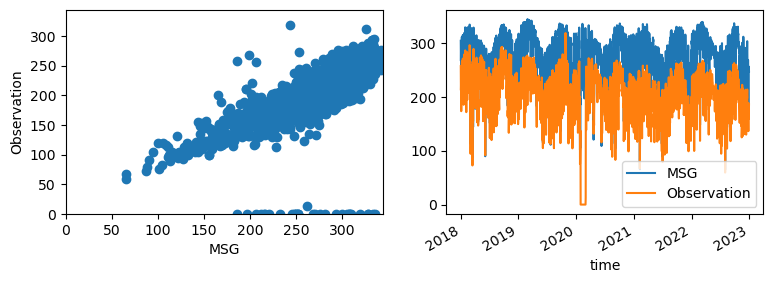

TA00187


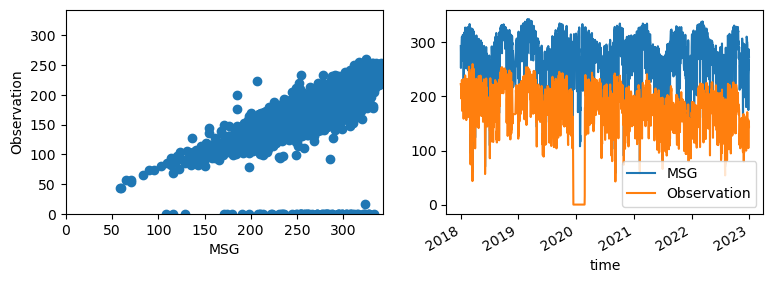

TA00189


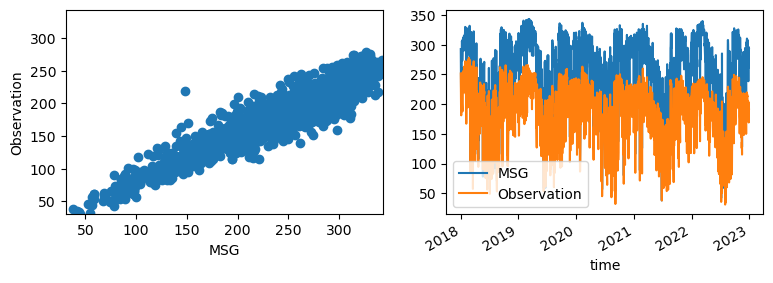

TA00190


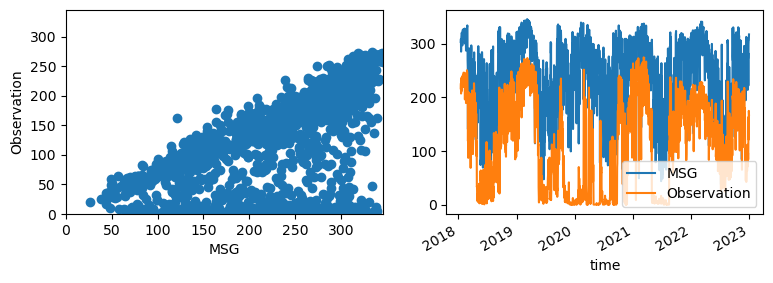

TA00192


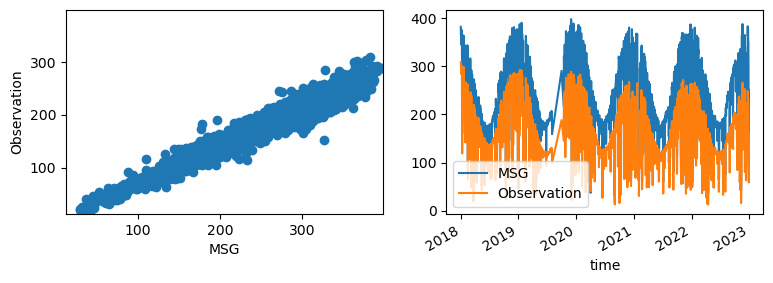

TA00196


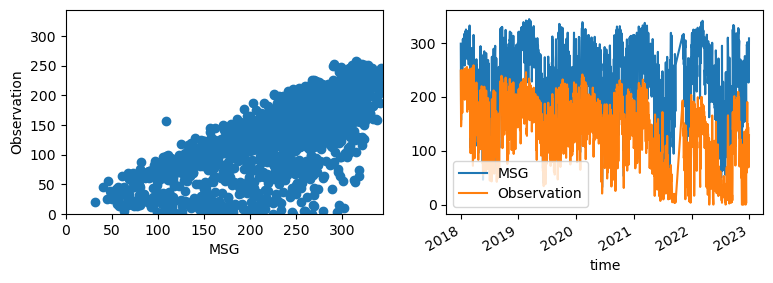

TA00241


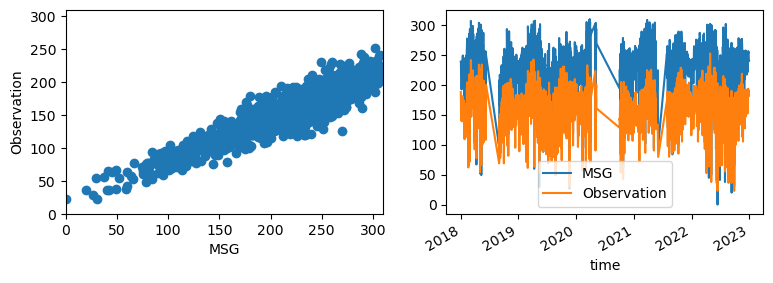

TA00242


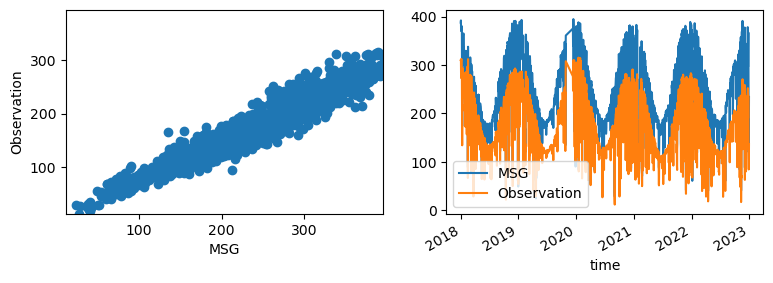

TA00243


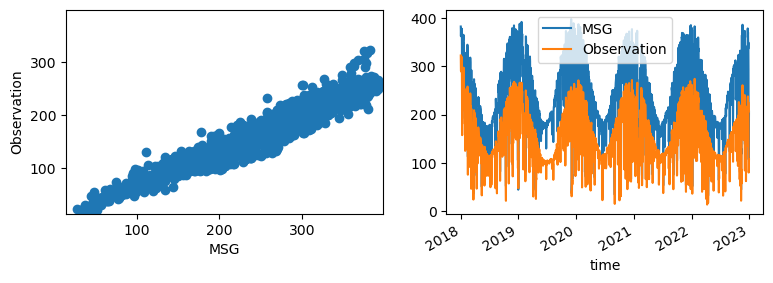

TA00244


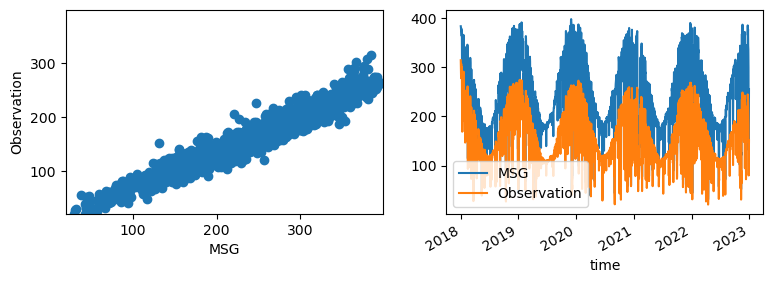

TA00247


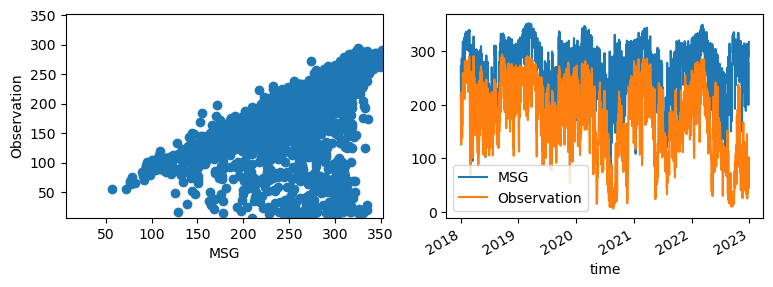

TA00249


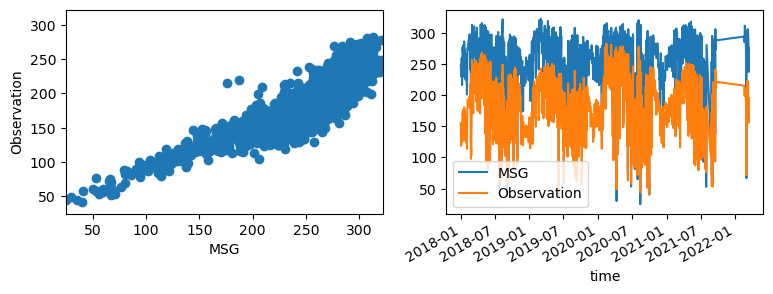

TA00251


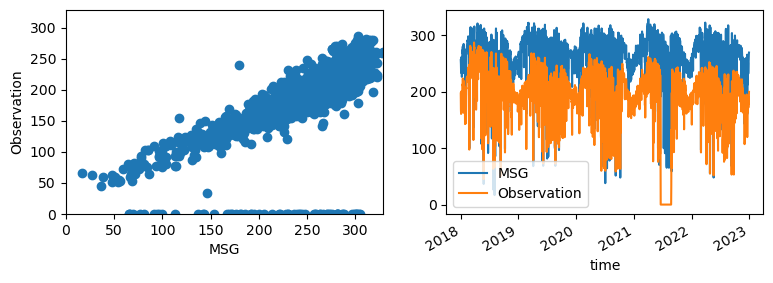

TA00253


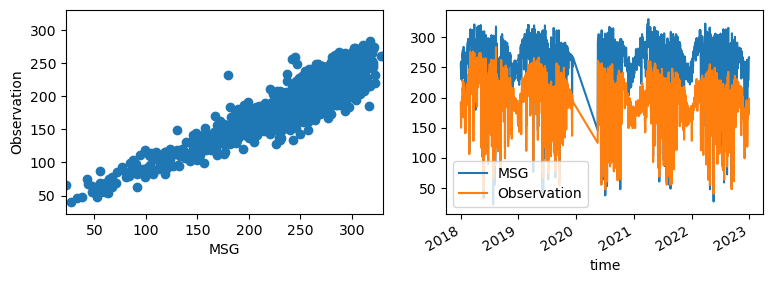

TA00254


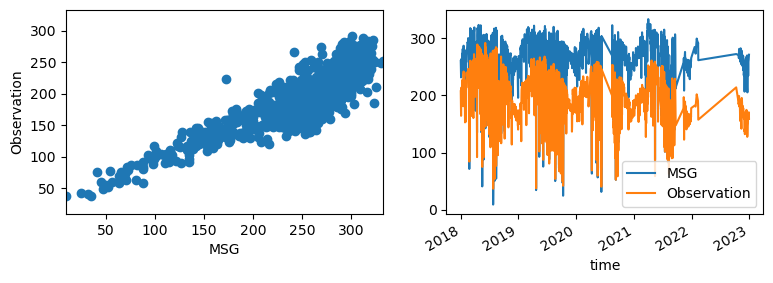

TA00259


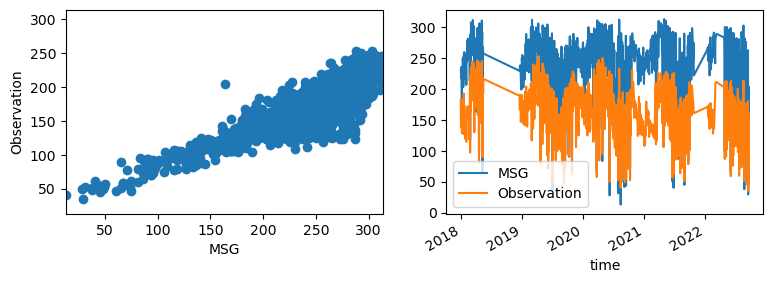

TA00260


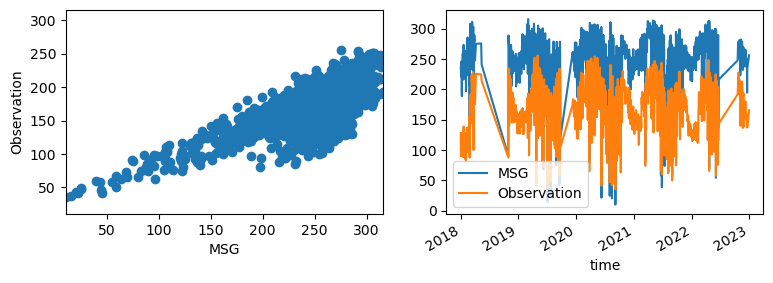

TA00264


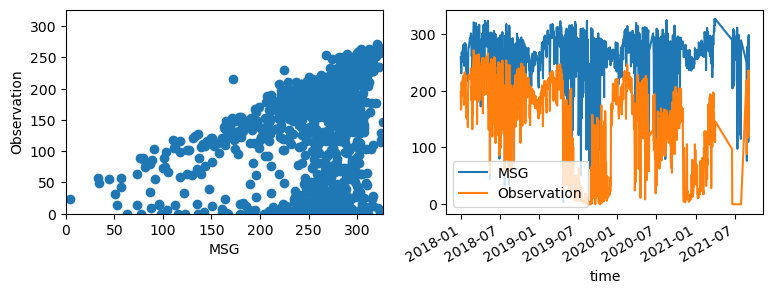

TA00265


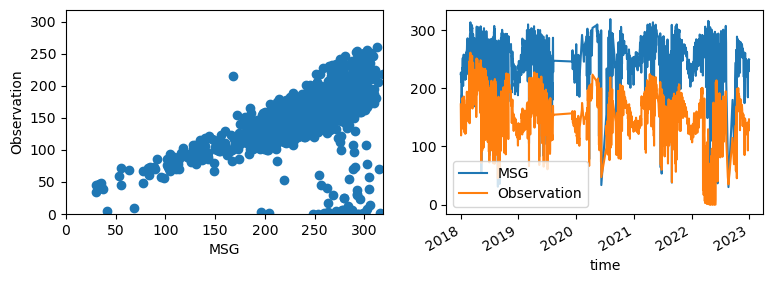

TA00266


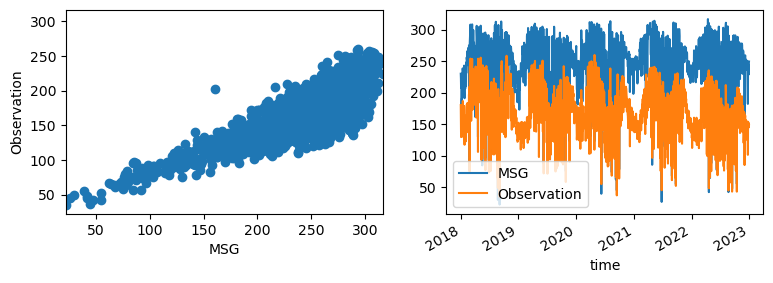

TA00268


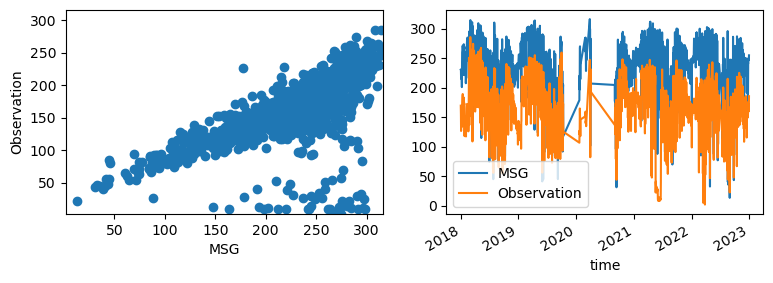

TA00275


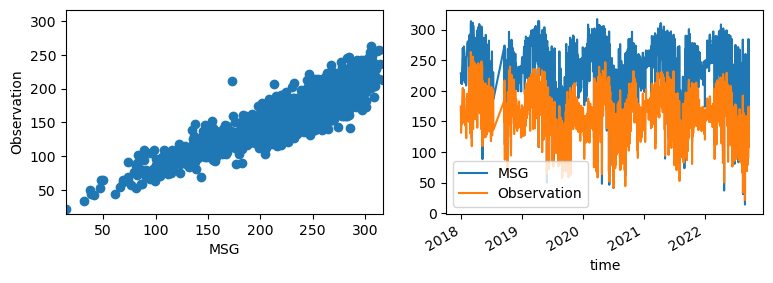

TA00277


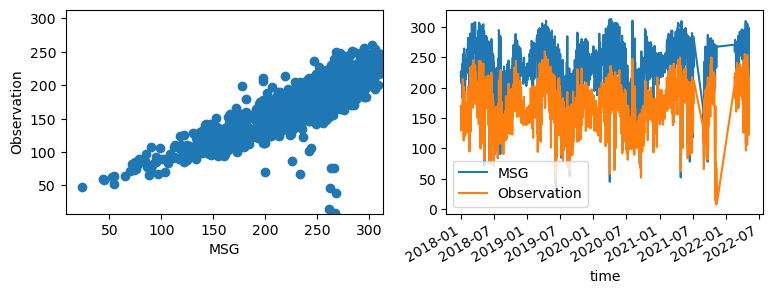

TA00280


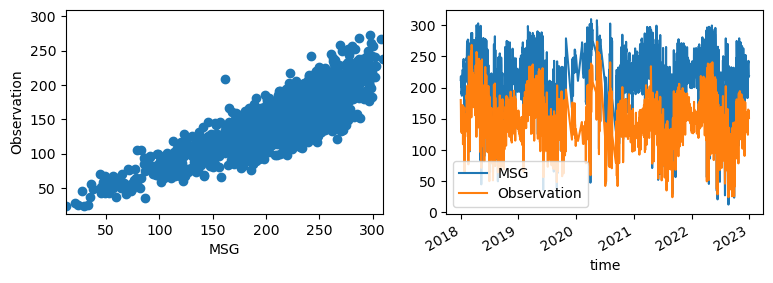

TA00281


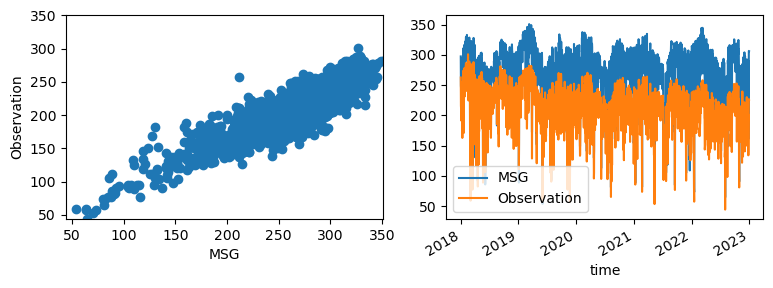

TA00282


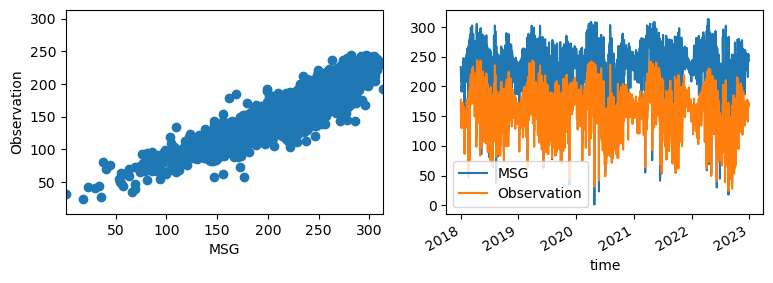

TA00301


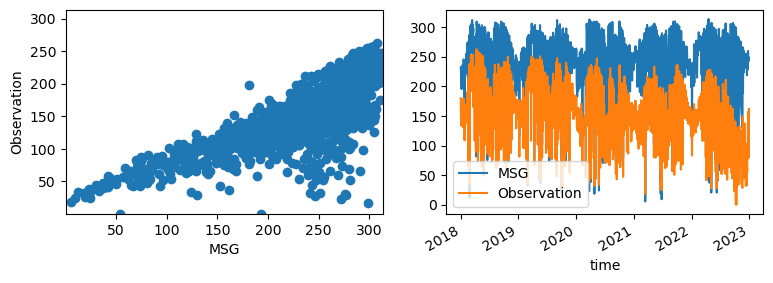

TA00302


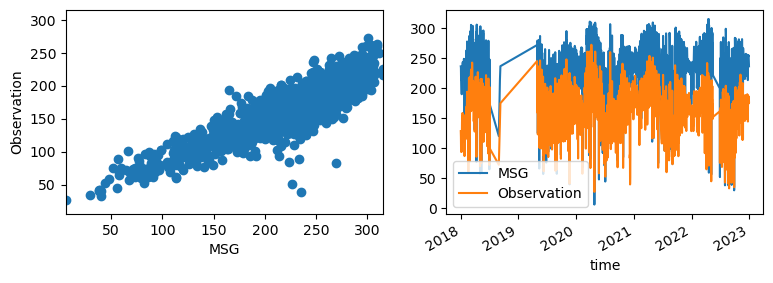

TA00308


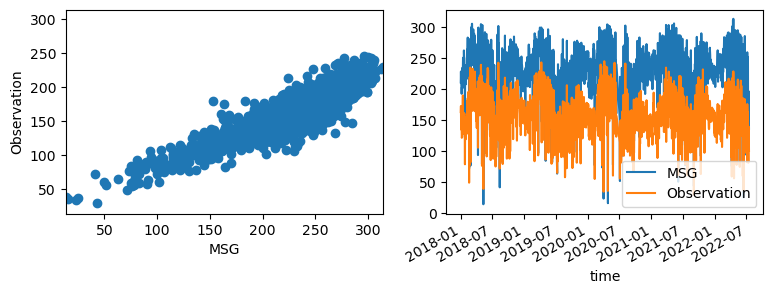

TA00310


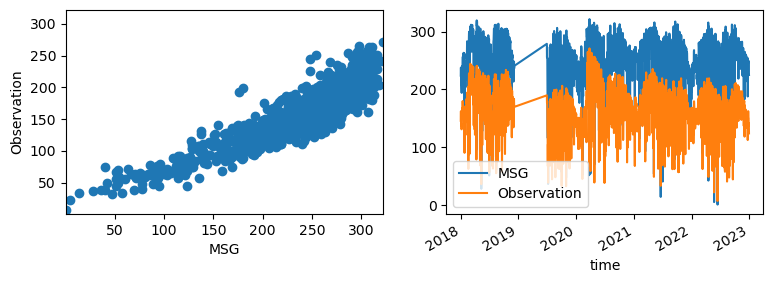

TA00319


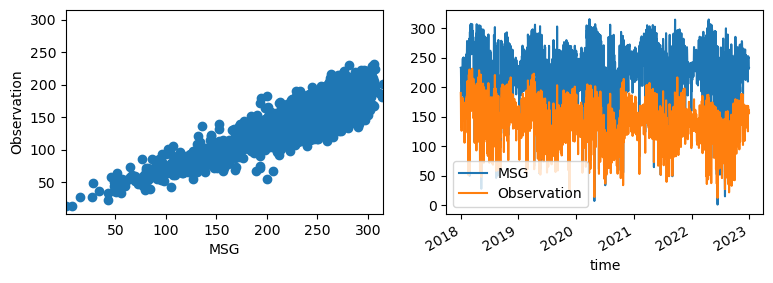

TA00354


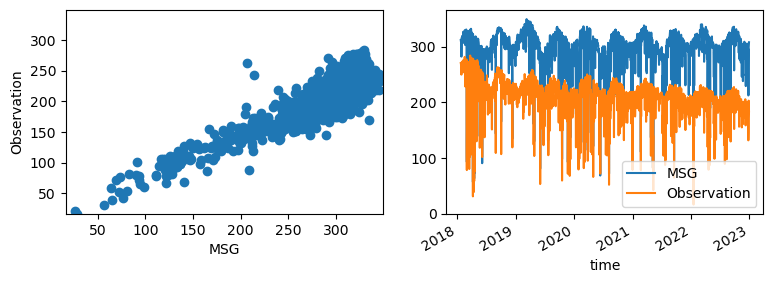

TA00355


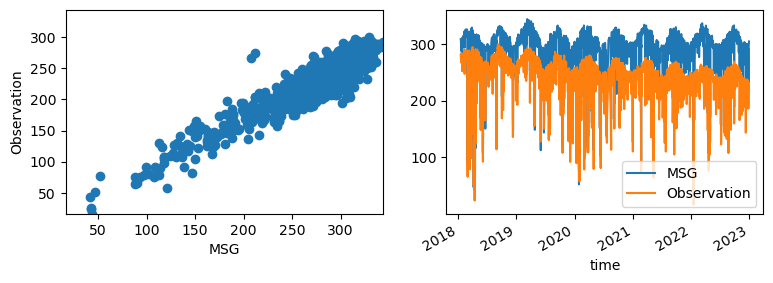

TA00359


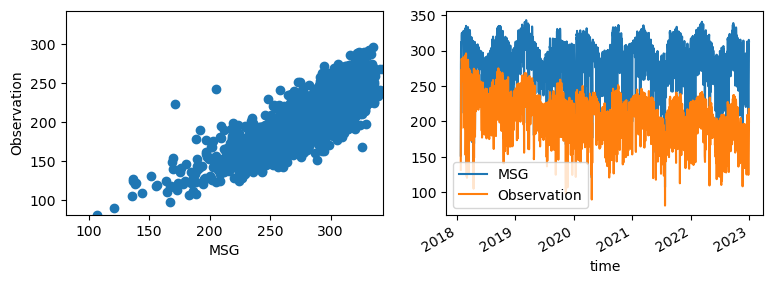

TA00360


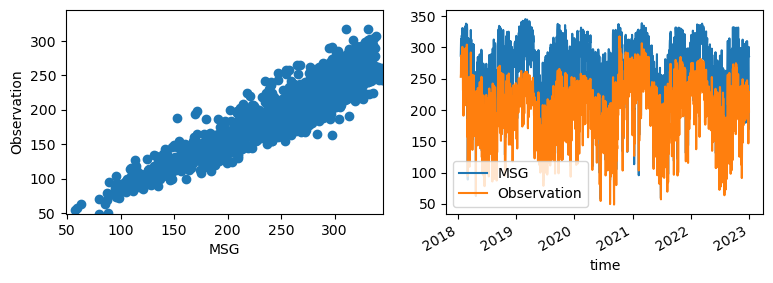

TA00372


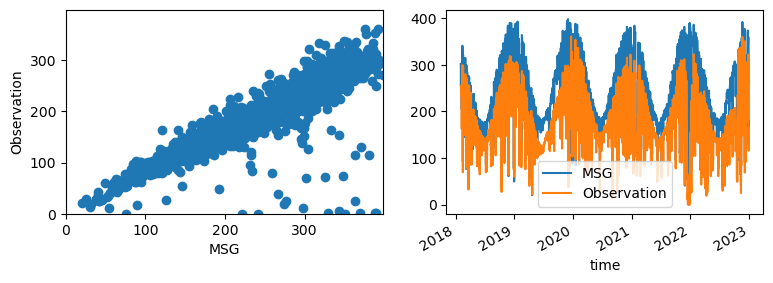

TA00373


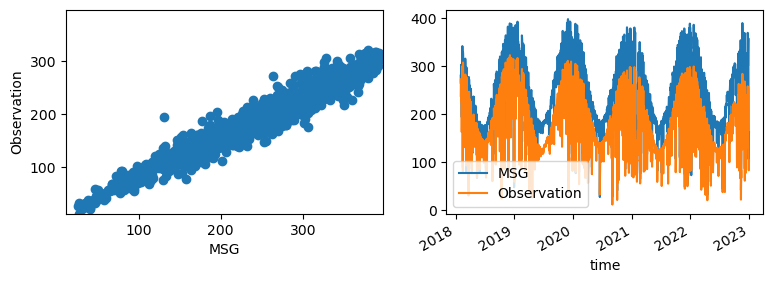

TA00377


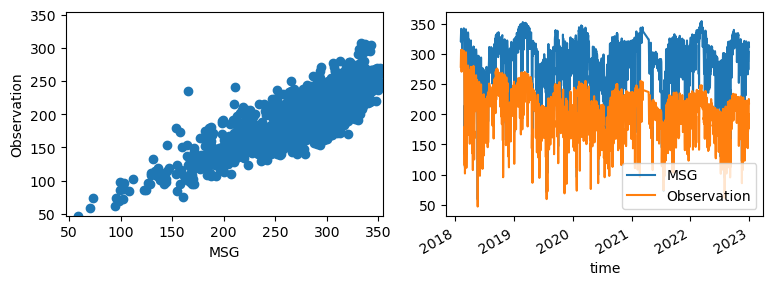

TA00379


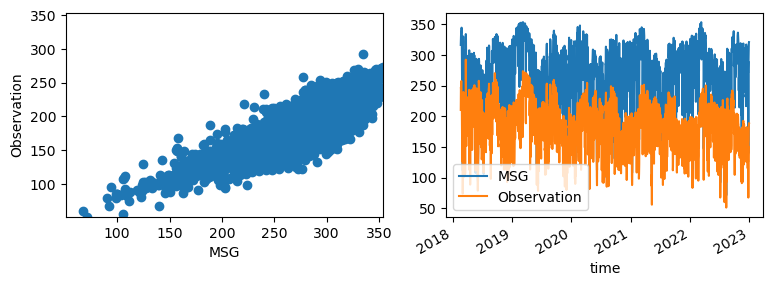

TA00386


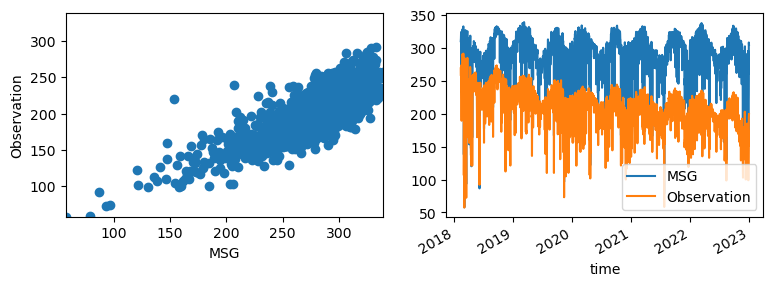

TA00391


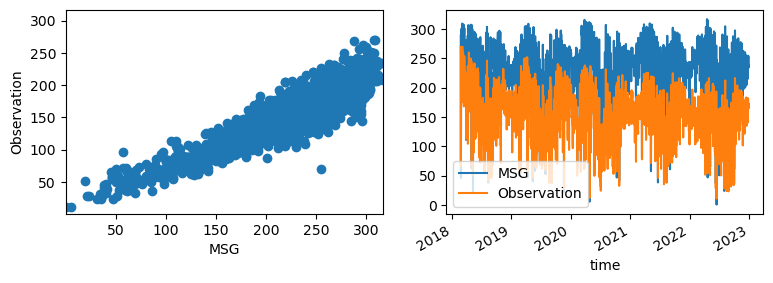

TA00392


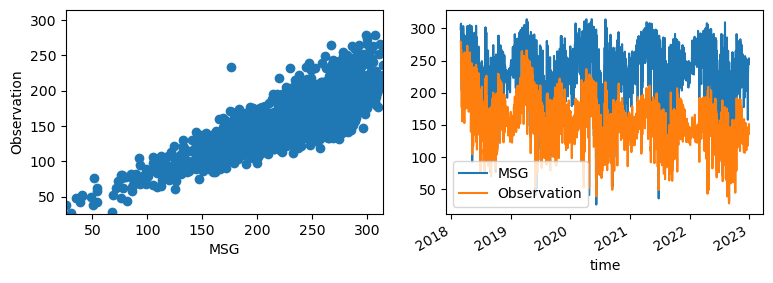

TA00393


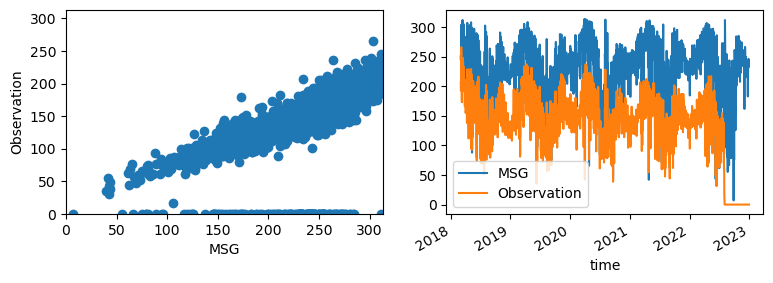

TA00416


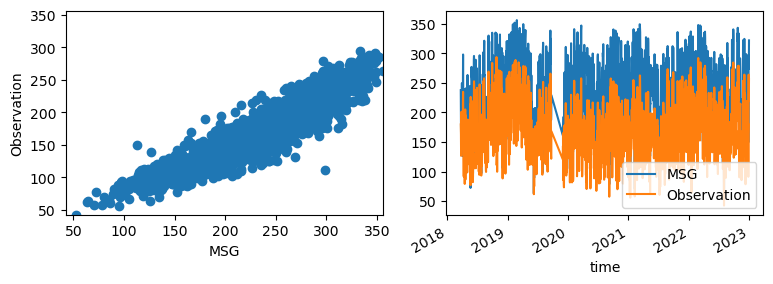

TA00441


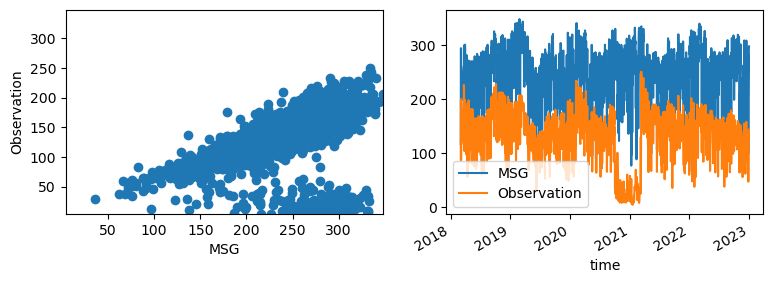

TA00444


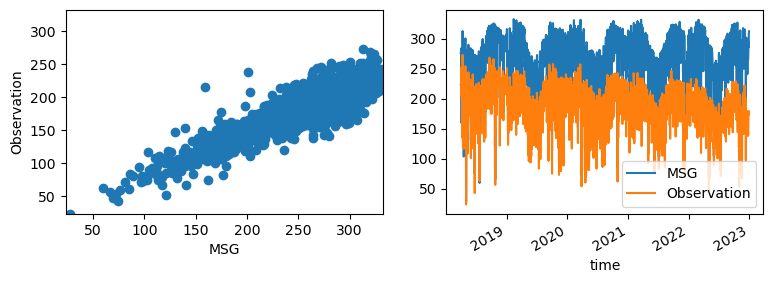

TA00448


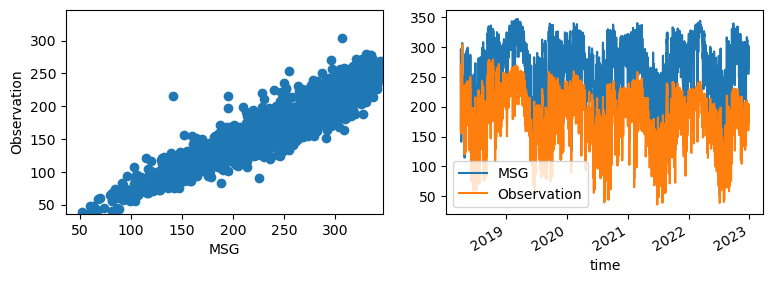

TA00470


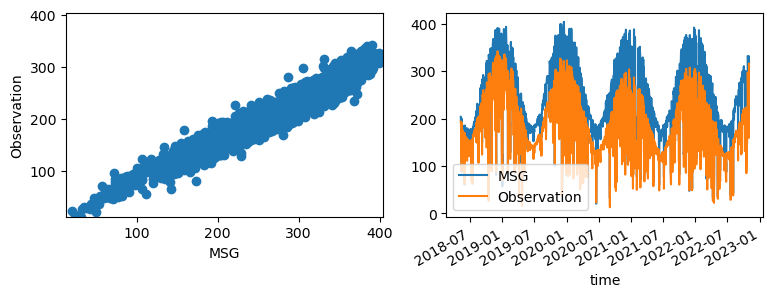

TA00473


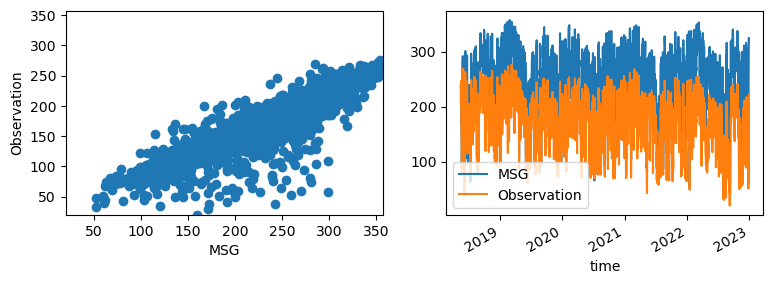

TA00480


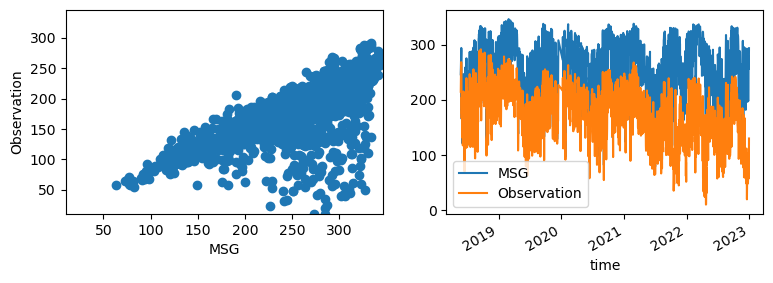

TA00486


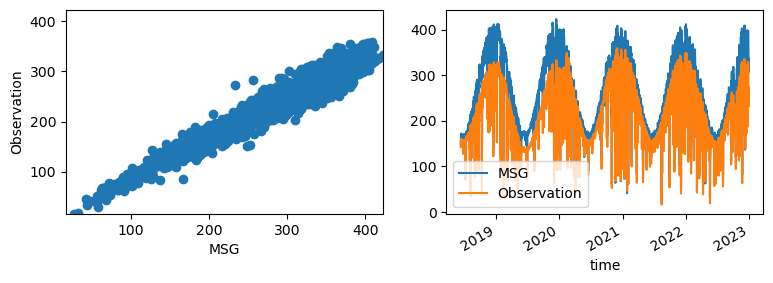

TA00567


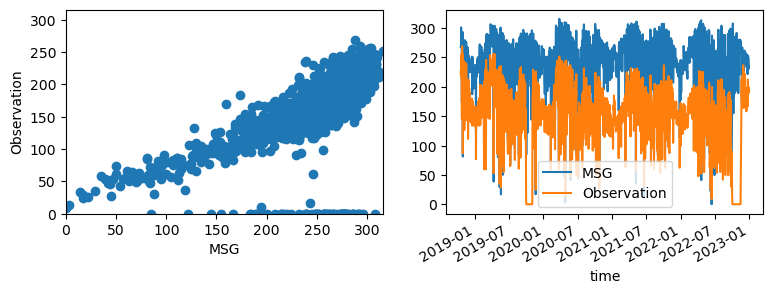

TA00568


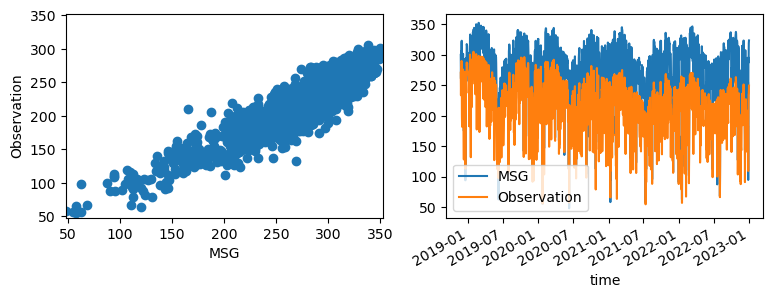

TA00569


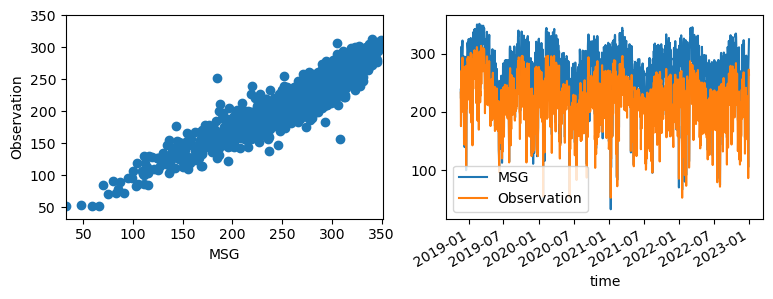

TA00573


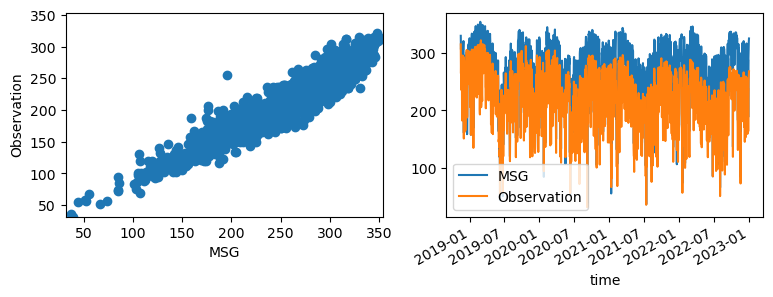

TA00617


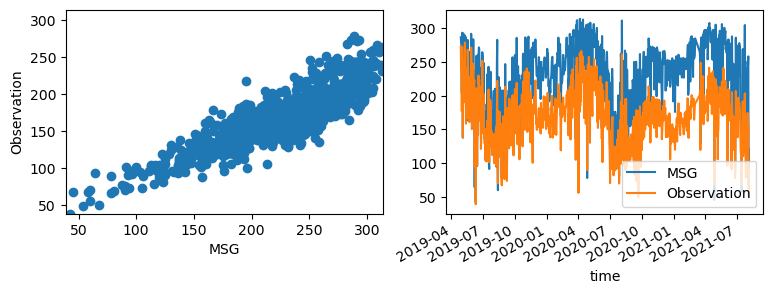

TA00621


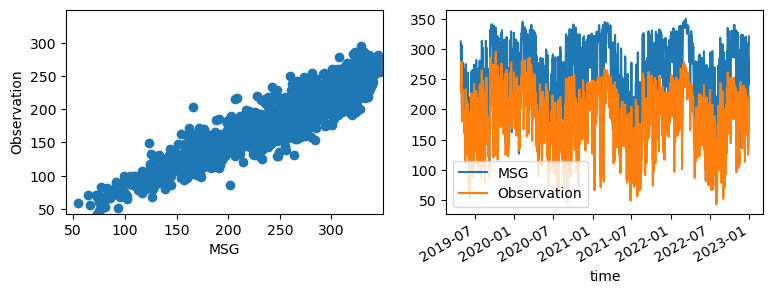

TA00625


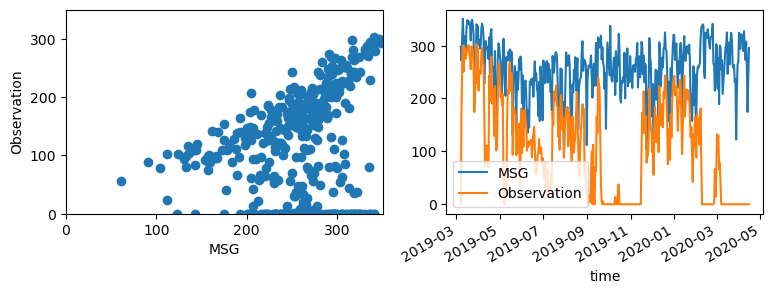

TA00626


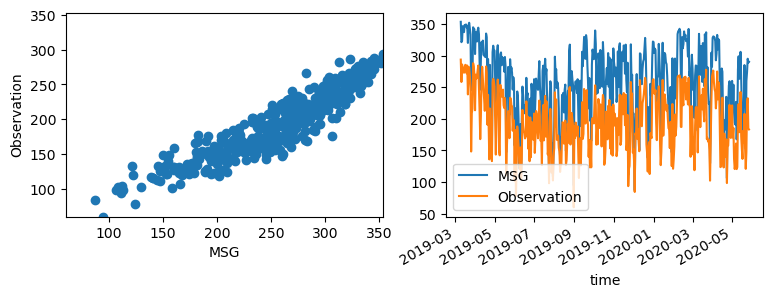

TA00627


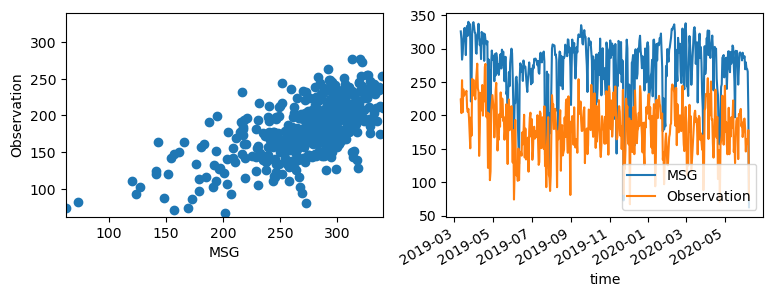

TA00628


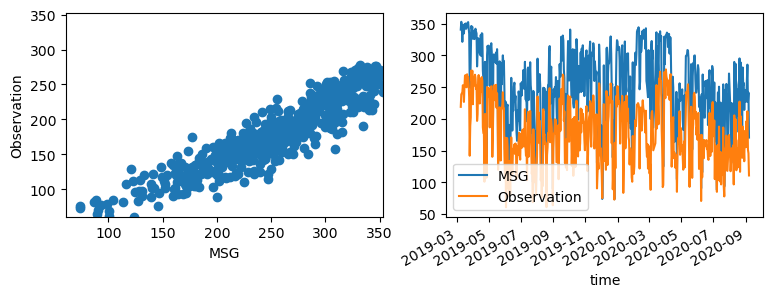

TA00629


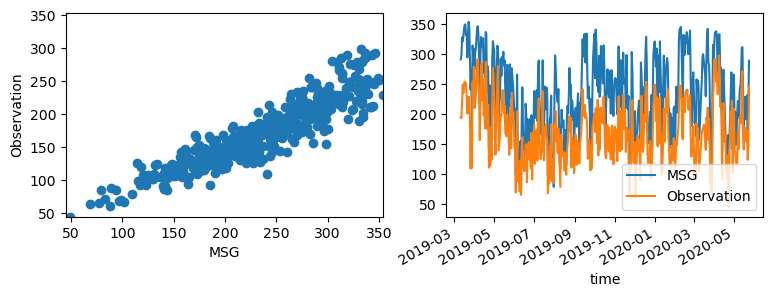

TA00630


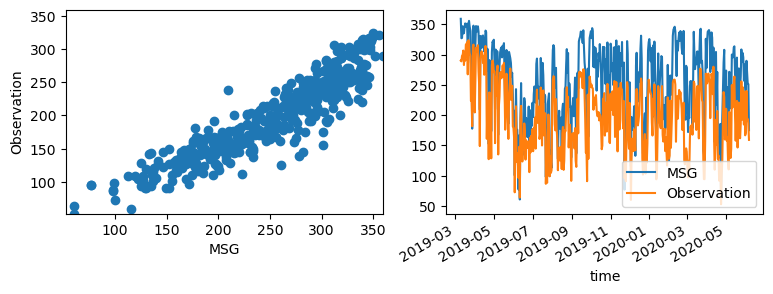

TA00631


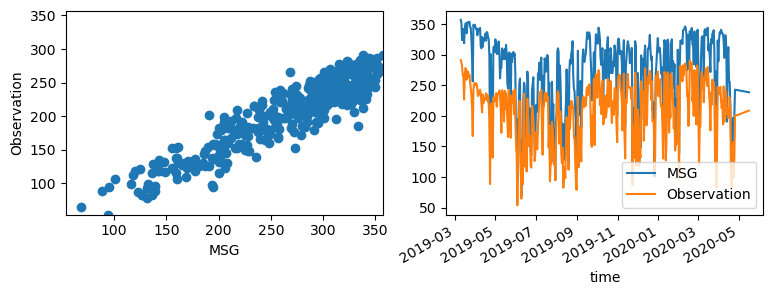

TA00647


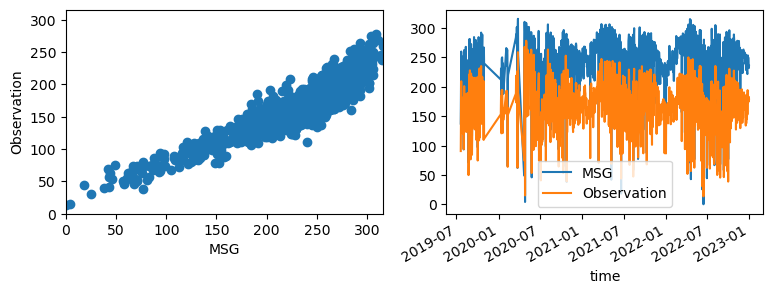

TA00651


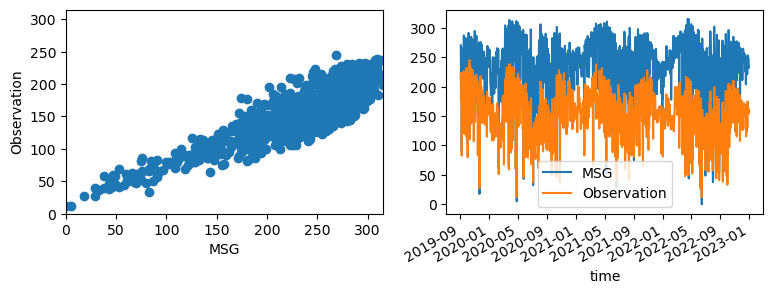

TA00652


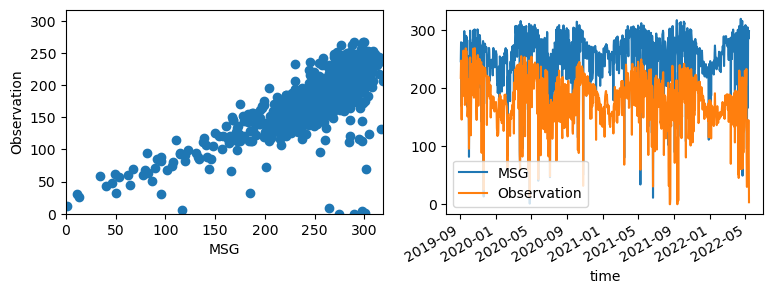

TA00678


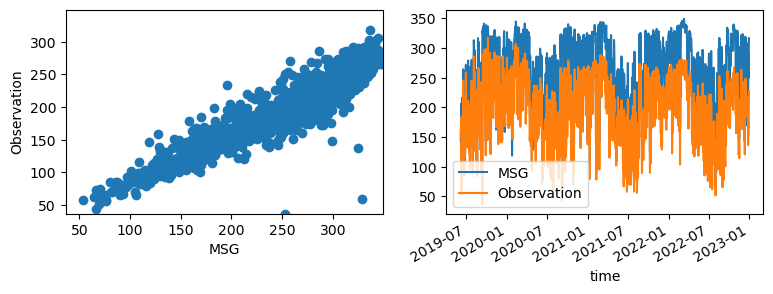

TA00680


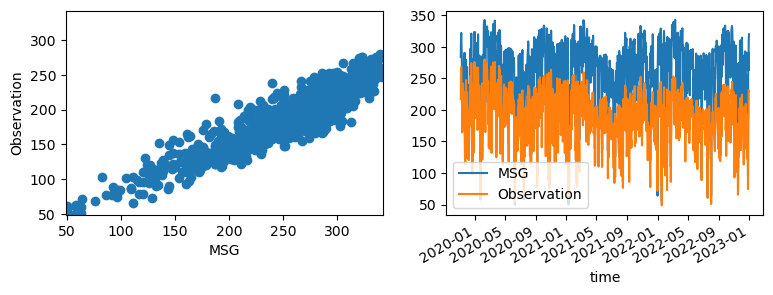

TA00689


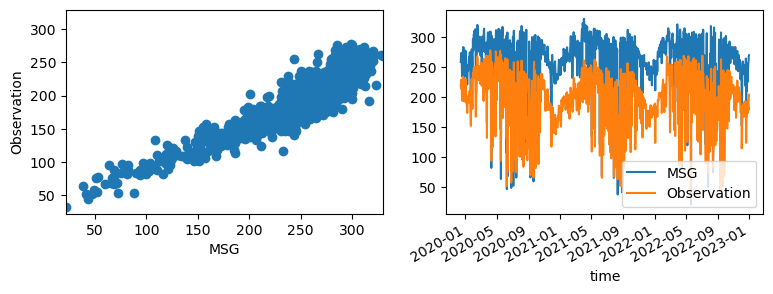

TA00690


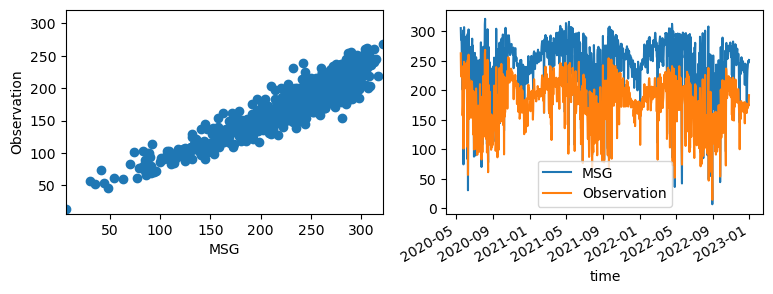

TA00691


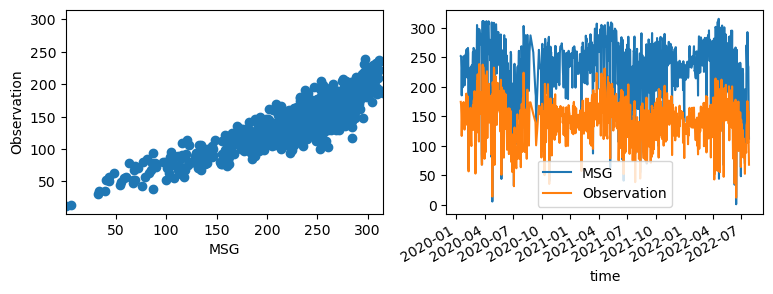

TA00714


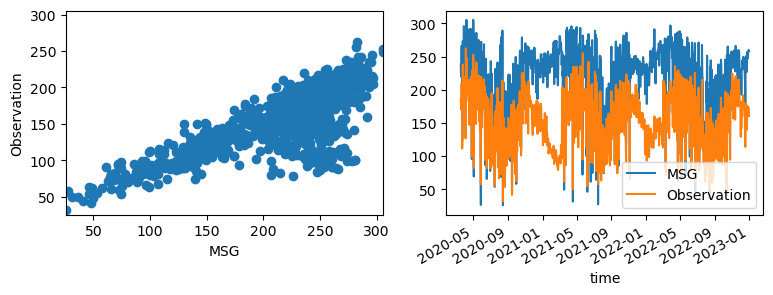

TA00725


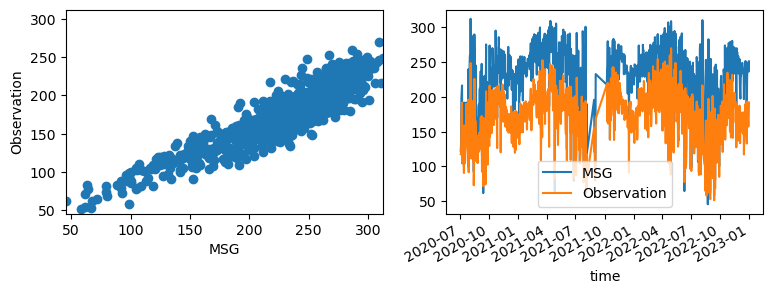

TA00754


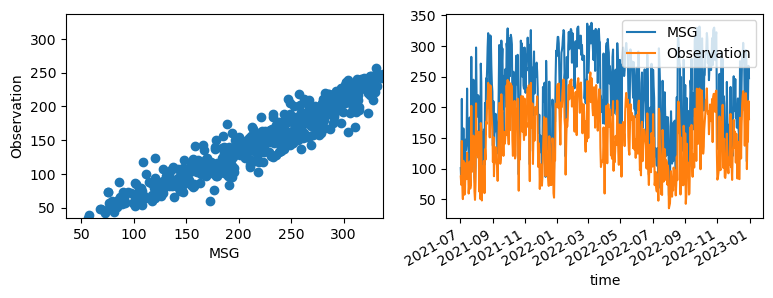

TA00767


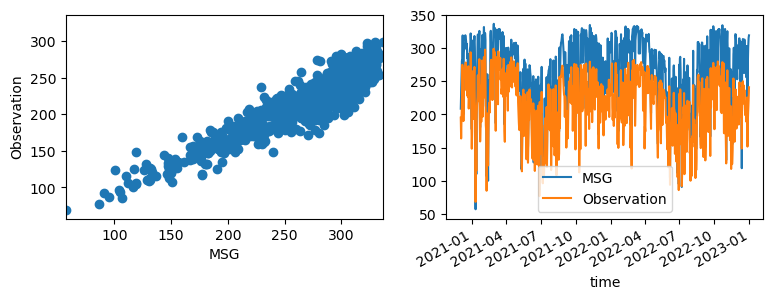

TA00099


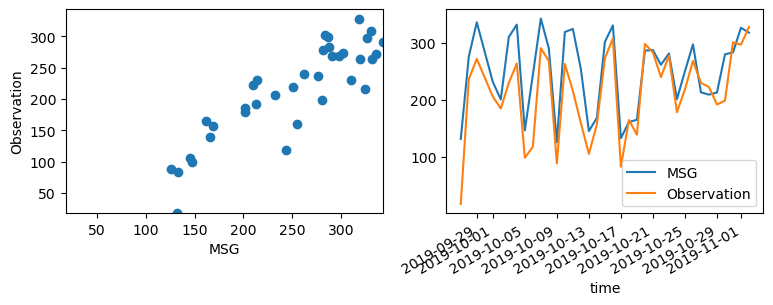

TA00154


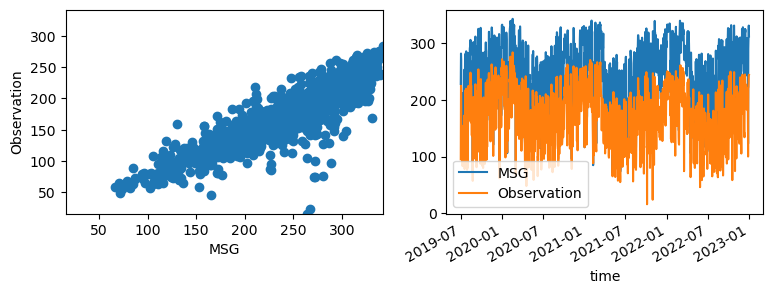

TA00269


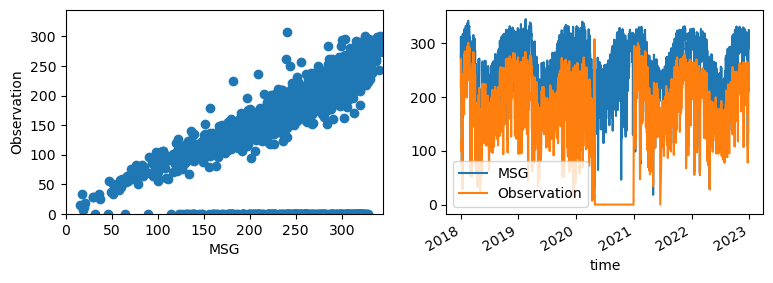

TA00270


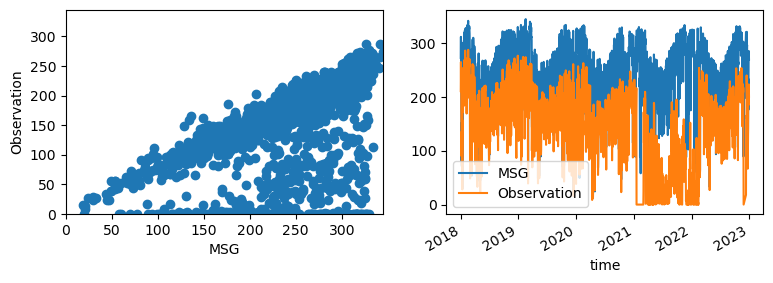

TA00271


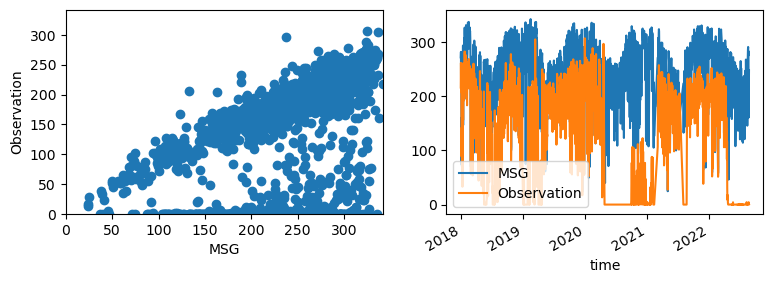

TA00272


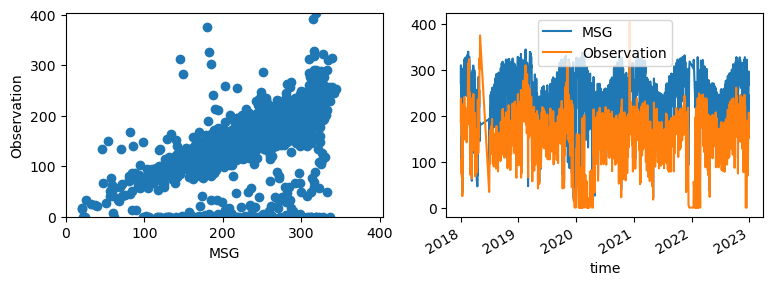

TA00273


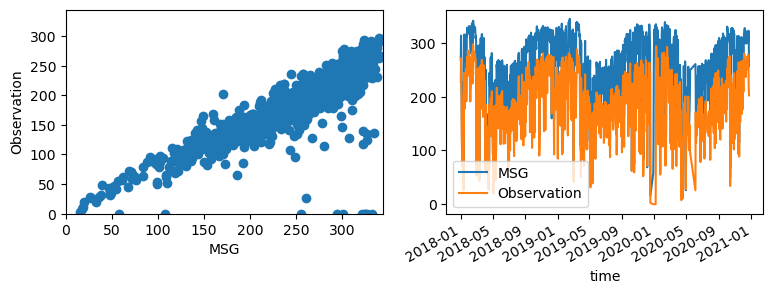

TA00422


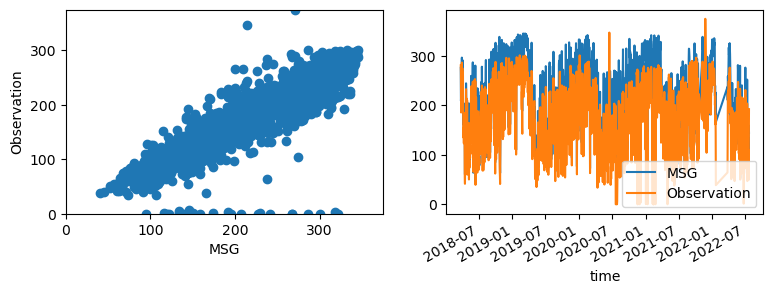

TA00493


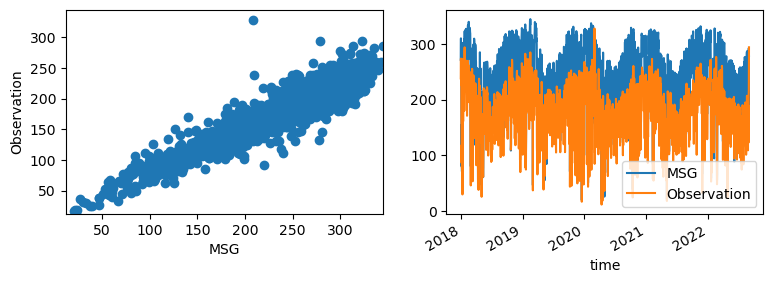

TA00494


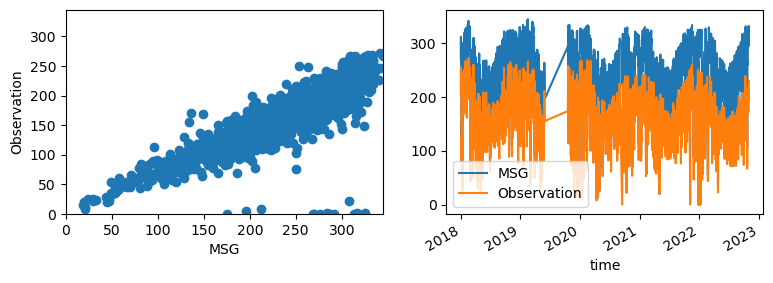

TA00495


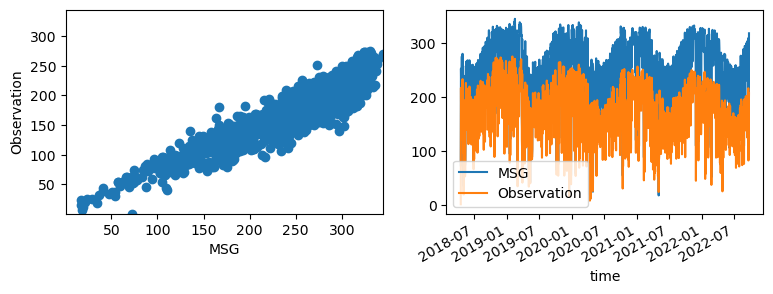

TA00589


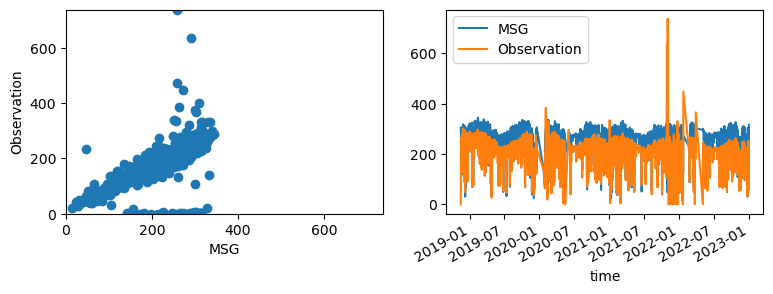

TA00590


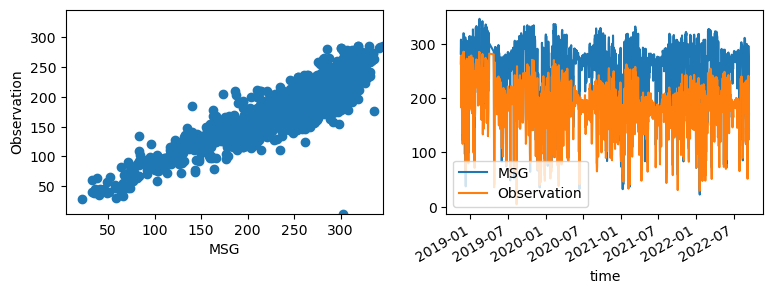

TA00591


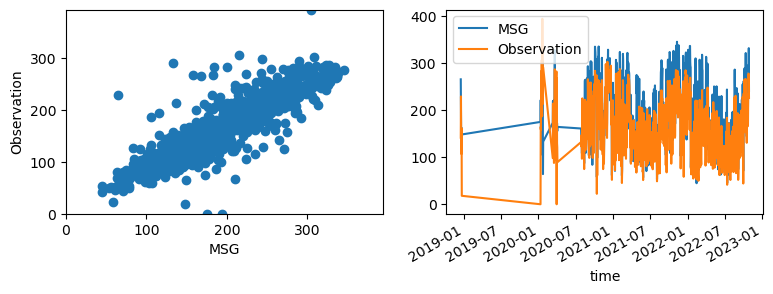

TA00592


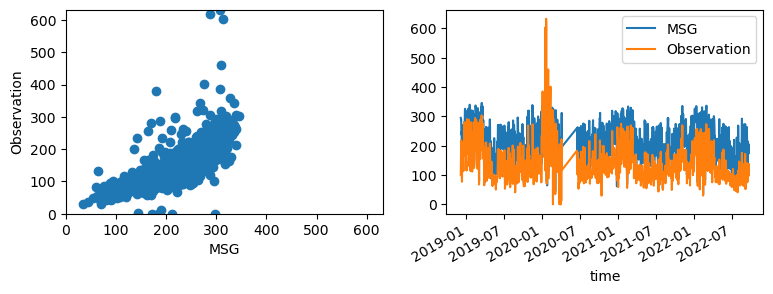

TA00593


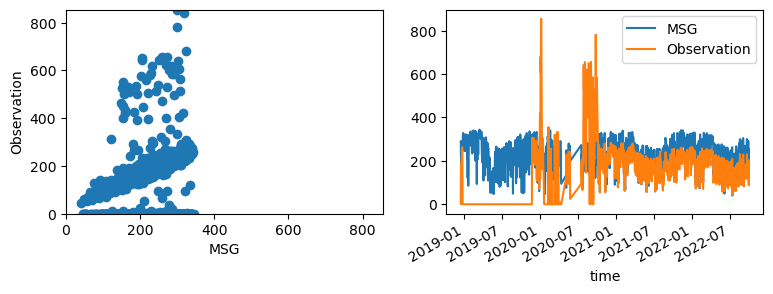

TA00594


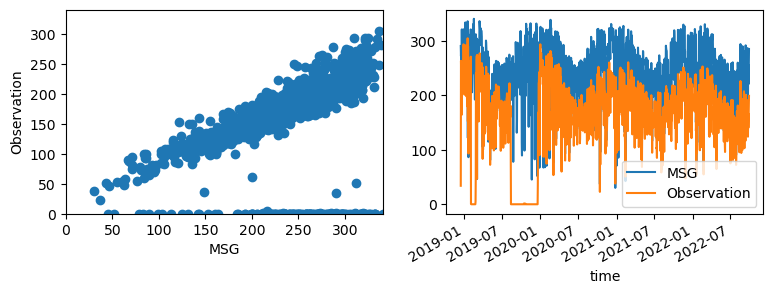

TA00595


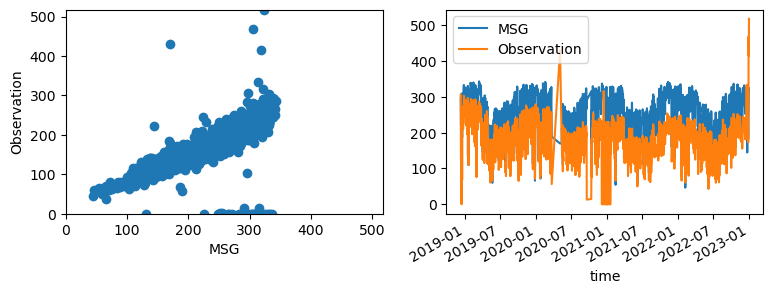

TA00663


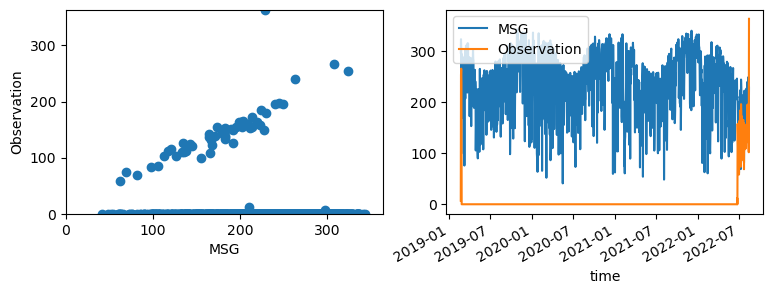

TA00664


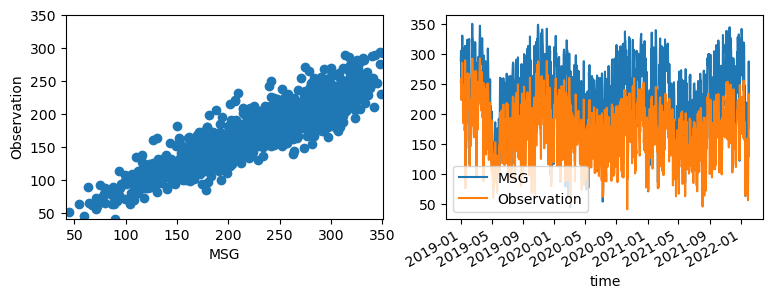

TA00670


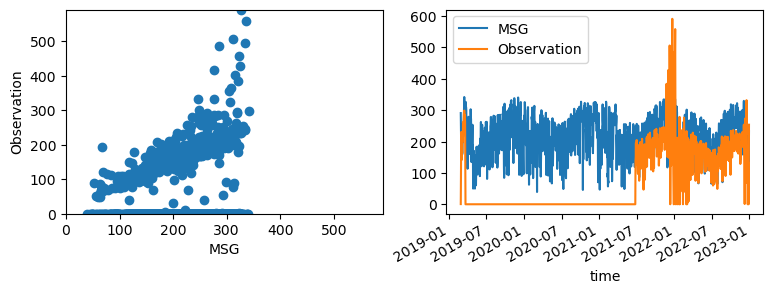

TA00671


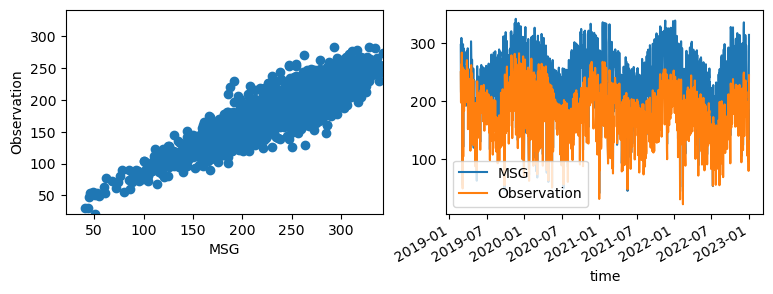

TA00672


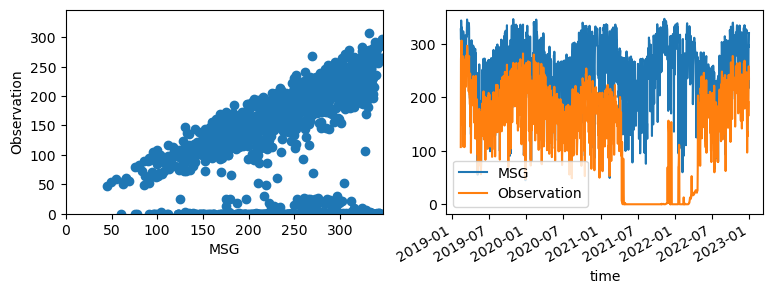

TA00676


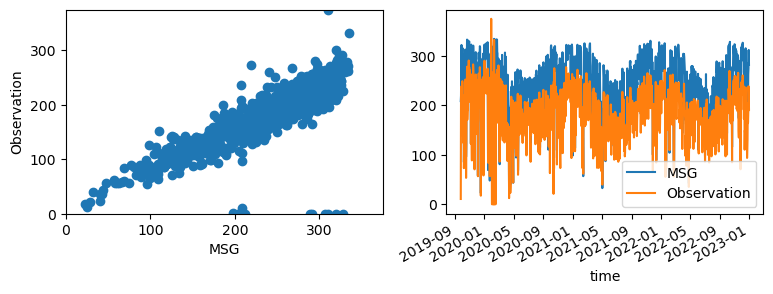

TA00712


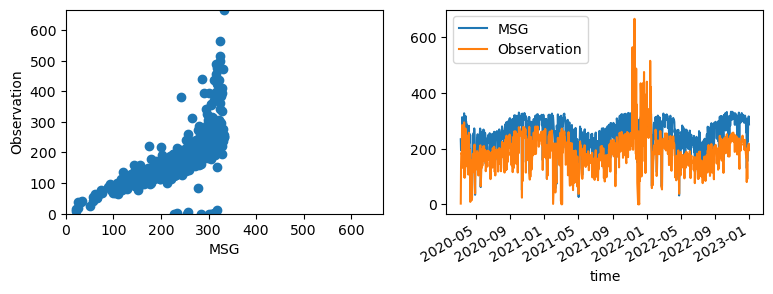

TA00713


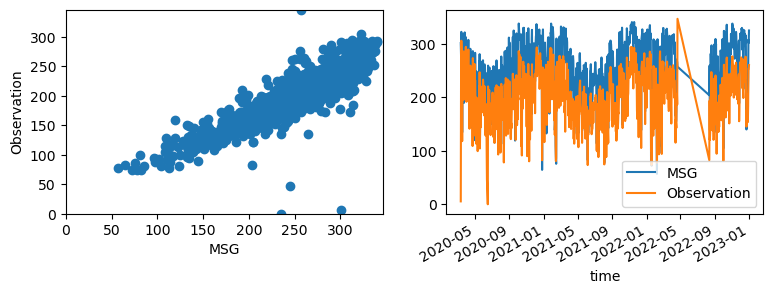

TA00750


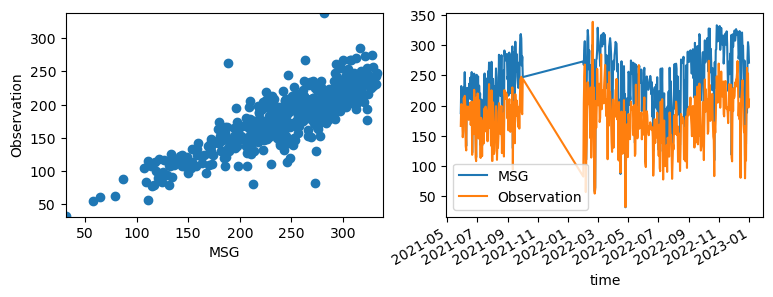

TA00751


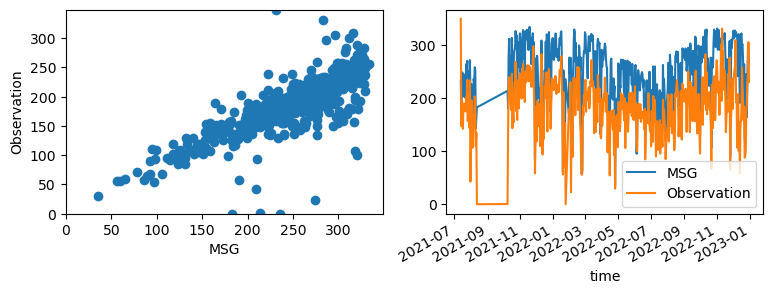

TA00753


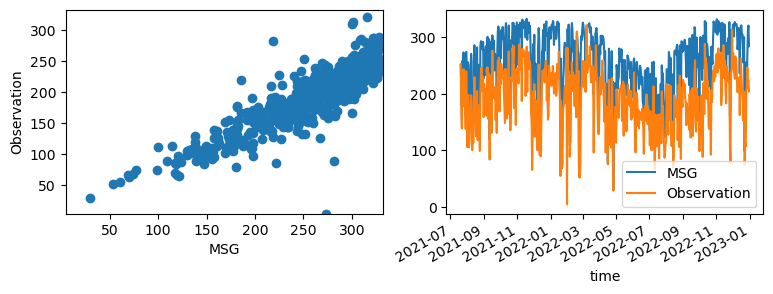

In [12]:
for product_name in products:
    product_folder = r"../2_extract/data/{0}/daily".format(product_name)
    for i,row in df_stations_metrics.iterrows():        
        station=row["Station"]
        network=row['Network']
        print(station)
        # read data from product
        product_fh = os.path.join(product_folder,network+"_"+station+".csv")
        product_df = pd.read_csv(product_fh, parse_dates=True)
        # read data from observation
        obs_fh = os.path.join(obs_folder,network,station+".csv")       
        obs_df=pd.read_csv(obs_fh, parse_dates=True,sep=';')      
        #print(obs_fh) ## check loop
        # formating data
        obs_df=obs_df.rename(columns={"timestamp":"time"}) #rename column "time" 
        merge_df = pd.merge(product_df, obs_df, #merge product based on column "time"
                            on = "time",                     
                    how="inner") 
        merge_df.index=pd.to_datetime(merge_df['time']) #convert to datetimeindex
        var_cols = {
                var_name: product_name,
                col_name: "Observation"}
        merge_df = merge_df.rename(columns=var_cols)
        df_var = merge_df[[product_name,'Observation']]
        #validataion: calculating metrics
        df_val = df_var.dropna()
        if len(df_val) < 1:
            continue
        df_stations.loc[i,var_name+'_'+product_name+'_'+'N']=len(df_val)
        # metrics=calc_metrics(df_val[product_name], df_val['Observation'])
        #plot graphs
        fig,axs=plt.subplots(1,2,figsize=(9,3))
        axs[0].scatter(df_val[product_name],df_val["Observation"])
        axs[0].set_xlabel(product_name)
        axs[0].set_ylabel("Observation")
        axs[0].set_xlim(np.min(df_val.min()),np.max(df_val.max()))
        axs[0].set_ylim(np.min(df_val.min()),np.max(df_val.max()))        
        df_val.plot(y=[product_name,"Observation"],ax=axs[1])
        plt.show()


In [11]:
len(df_val)

0